In [1]:
# Importamos librerias necesarias
from sklearn import model_selection
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import percentileofscore
from sklearn.preprocessing import PolynomialFeatures
from scipy.optimize import curve_fit
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, log_loss
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

database= pd.read_csv('diabetes_012_health_indicators_BRFSS2015.csv')     # Leemos la base de datos

## Tema 1 - Introducción

### a) Análisis descriptivo de la base de datos

In [2]:
nombres_variables = database.columns.tolist()                                                                  # Mostramos todas las variables disponibles de nuestro database
num_observaciones, num_variables = database.shape


print(f"Variables de nuestro database: {', '.join(nombres_variables)}\n"                                       # Join sirve para poner todo en una linea
      f"Número de variables: {num_variables}\n"
      f"Número de observaciones: {num_observaciones}\n"                                                 # Len() sirve para indicar el numero de variables.
      "Tipos de cada variable: " + ", ".join([f"{col}: {dtype}" for col, dtype in database.dtypes.items()]))

Variables de nuestro database: Diabetes_012, HighBP, HighChol, CholCheck, BMI, Smoker, Stroke, HeartDiseaseorAttack, PhysActivity, Fruits, Veggies, HvyAlcoholConsump, AnyHealthcare, NoDocbcCost, GenHlth, MentHlth, PhysHlth, DiffWalk, Sex, Age, Education, Income
Número de variables: 22
Número de observaciones: 253680
Tipos de cada variable: Diabetes_012: float64, HighBP: float64, HighChol: float64, CholCheck: float64, BMI: float64, Smoker: float64, Stroke: float64, HeartDiseaseorAttack: float64, PhysActivity: float64, Fruits: float64, Veggies: float64, HvyAlcoholConsump: float64, AnyHealthcare: float64, NoDocbcCost: float64, GenHlth: float64, MentHlth: float64, PhysHlth: float64, DiffWalk: float64, Sex: float64, Age: float64, Education: float64, Income: float64


**CARACTERÍSTICAS DEL DATASET ESCOGIDO**

El dataset de nuestro caso de estudio contiene 253680 instacias, cada una con 22 atributos. Los valores de
todos los atributos están codificados como números enteros. El atributo “Diabetes_012” representa el
diagnóstico de los pacientes, que puede ser: diabético (2), prediabético (1) o no diabético (0). Este atributo
fue el escogido como clase para las predicciones de los modelos.

El resto de los atributos representan los diferentes indicadores evaluados en los pacientes, de distinta índole: factores de riesgo cardiovascular o enfermedades relacionadas e índices relativos al estilo de vida, a la autopercepción de la salud y al acceso a la atención médica y demográficos. Una característica importante de nuestro dataset es la ausencia de “Missing Values”: todas las instancias tienen valores en todos sus atributos. Esto facilitará el entrenamiento de los modelos.

In [3]:
database.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


In [4]:
database.describe(include='all')

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,...,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.296921,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,...,0.951053,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875
std,0.698160,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,...,0.215759,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,2.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


In [5]:
database.nunique()

Diabetes_012             3
HighBP                   2
HighChol                 2
CholCheck                2
BMI                     84
Smoker                   2
Stroke                   2
HeartDiseaseorAttack     2
PhysActivity             2
Fruits                   2
Veggies                  2
HvyAlcoholConsump        2
AnyHealthcare            2
NoDocbcCost              2
GenHlth                  5
MentHlth                31
PhysHlth                31
DiffWalk                 2
Sex                      2
Age                     13
Education                6
Income                   8
dtype: int64

In [6]:
database['Diabetes_012'].value_counts()

Diabetes_012
0.0    213703
2.0     35346
1.0      4631
Name: count, dtype: int64

### b) Separe los datos en conjuntos de entrenamiento y test**

In [13]:
data_input = database.drop(['Diabetes_012'],axis=1)              # Nuestro input van a ser todas las variables menos nuestra varaible de salida
data_output = database['Diabetes_012']                           # Nuestro output es la variable 'Diabetes_012'
#Cortamos nuestro dataset en training y test.
X_train, X_test, y_train, y_test = train_test_split(data_input, data_output, test_size=0.3, random_state=42) #Generador de numeros aleatorios.

In [8]:
X_train.describe(include='all')

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,...,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000
mean,0.428515,0.423407,0.962574,28.379584,0.443298,0.040518,0.094585,0.756915,0.634427,0.811799,...,0.950832,0.084217,2.512445,3.192993,4.254792,0.168356,0.439969,8.030190,5.049151,6.050480
std,0.494865,0.494100,0.189804,6.620722,0.496776,0.197171,0.292641,0.428947,0.481592,0.390874,...,0.216219,0.277714,1.069102,7.426580,8.734943,0.374183,0.496385,3.053795,0.986963,2.073648
min,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


In [9]:
X_test.describe(include='all')

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,76104.000000,76104.000000,76104.000000,76104.000000,76104.000000,76104.000000,76104.000000,76104.000000,76104.000000,76104.000000,...,76104.000000,76104.000000,76104.000000,76104.000000,76104.00000,76104.000000,76104.000000,76104.000000,76104.000000,76104.000000
mean,0.430135,0.425786,0.962893,28.388849,0.442868,0.040694,0.093254,0.755676,0.633856,0.810536,...,0.951566,0.084082,2.508935,3.165589,4.21242,0.167915,0.441212,8.036621,5.053427,6.061797
std,0.495098,0.494465,0.189026,6.580583,0.496728,0.197582,0.290790,0.429688,0.481753,0.391880,...,0.214682,0.277513,1.067022,7.380717,8.67816,0.373793,0.496535,3.055227,0.982995,2.065293
min,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.00000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.00000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.00000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,2.000000,3.00000,0.000000,1.000000,10.000000,6.000000,8.000000
max,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.00000,1.000000,1.000000,13.000000,6.000000,8.000000


In [10]:
y_train.describe(include='all')

count    177576.000000
mean          0.297901
std           0.699289
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           2.000000
Name: Diabetes_012, dtype: float64

In [11]:
y_test.describe(include='all')

count    76104.000000
mean         0.294636
std          0.695517
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: Diabetes_012, dtype: float64

Hay que poner aqui la Teoria de datos de entrenamiento y test


### c) Visualice sus datos.
  
- Histogramas:

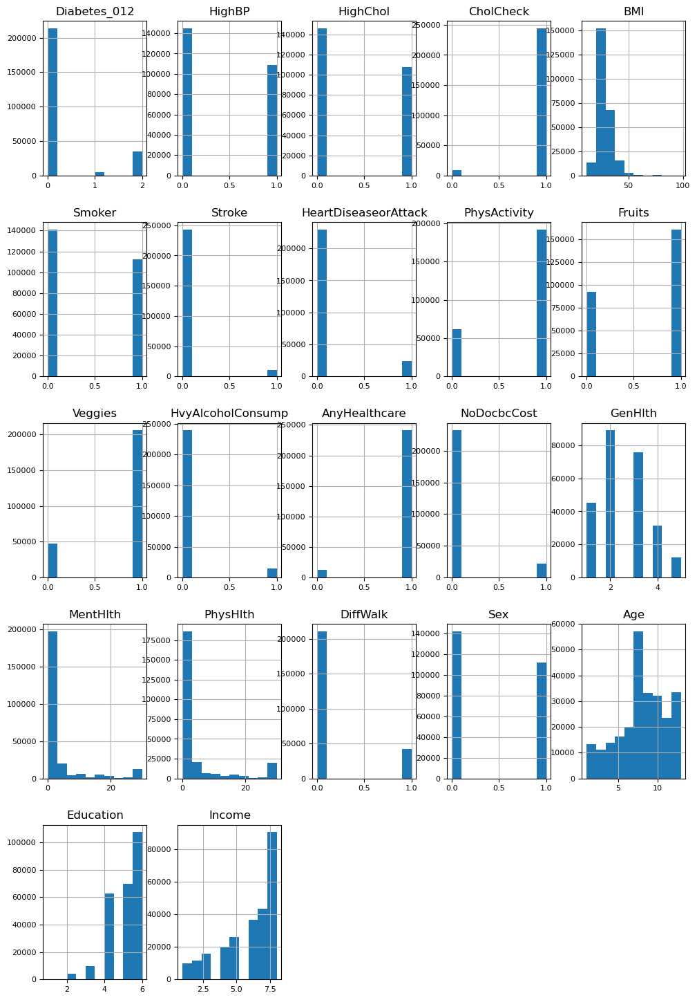

In [12]:
database.hist(figsize=(12,18), bins=10, xlabelsize=8, ylabelsize=8)
plt.axis('off')
plt.show()

Los histogramas nos ayudan a dar una rápida visualización de los datos, viendo la frecuencia de observaciones de cada valor de nuestras características.
Elegir bien el numero de bins es esencial para poder observar mejor la distribución de nuestras frecuencias.
Al separarlos por características, podemos observar las escalas que manejan y si están muy desbalanceadas. En el caso de las características de tipo binario, se puede apreciar muy bien en los histogramas.

Por ejemplo, podemos observar que la variable Diabetes_012 es una variable de tipo discreto con 3 valores (0,1 y 2) y que la clase mayoritaria es la 0 (no diabético). Al ser la salida de nuestro dataset, podemos hablar, gracias únicamente a su histograma, que tenemos clases muy desbalanceadas.

- **Diagrama de cajas:** <br>
Solo tiene sentidos en variables numéricas no binarias, ya que en las variables binarias no podemos calcular cuartiles, outliers etc... <br>
Nuestro problemas está en que las variables binarias se han guardado como variables tipo float, por lo que vamos a tener que limpiar los datos.


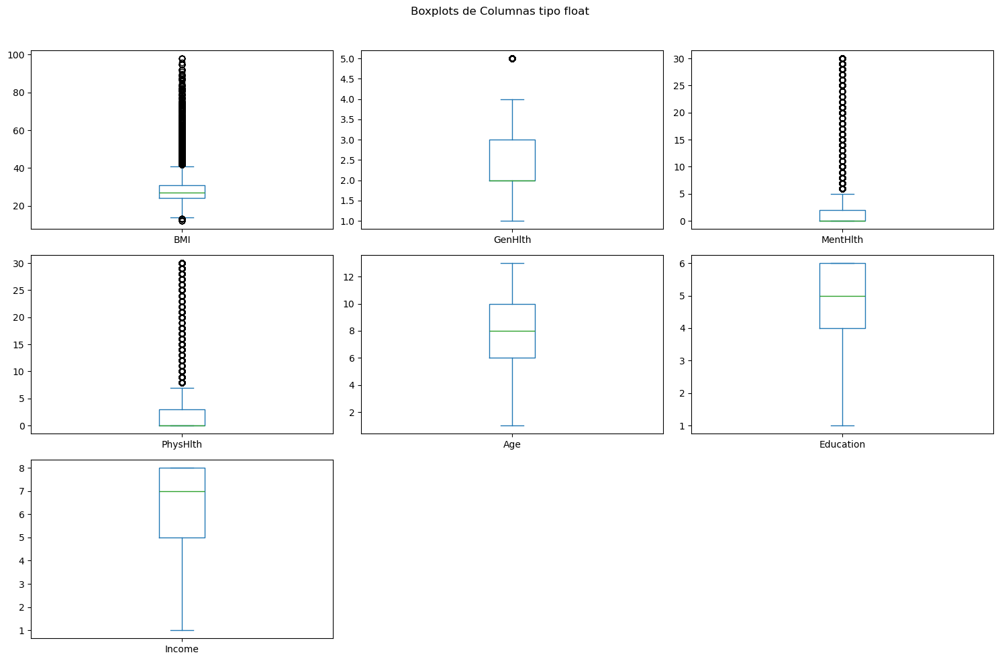

In [8]:
# Depuración de variables binarias
numeric_columns = database.select_dtypes(include=['float64']).columns                  # Seleccionamos todas las variables float y cogemos sus nombres

# Recorre todas las columnas de tipo float y si tiene mas de 3 valores diferentes, las guarda en la variable de columnas no binarias. 
# Ponemos 3 valores porque la variable Diabetes_012 no es binaria, pero solo tiene 3 valores, por lo que su diagrama de cajas no tiene sentido.
non_binary_columns = [col for col in numeric_columns if database[col].nunique() > 3]   
                                                                                                                       
non_binary_db= database[non_binary_columns]                                            # Se crea un database con valores no binarios

# Representación de los boxplot.
non_binary_db.plot(kind='box', subplots=True, layout=(3,3), sharex=False, sharey=False,figsize=(15,10))
plt.suptitle('Boxplots de Columnas tipo float')
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Ajustar el título
plt.show()
 



La linea verde representa la mediana, es decir el valor central de los datos. <br>
La caja es el rango intercuartílico (Q1 hasta Q3).  <br>
Los bigotes muestran el rango de los datos, sin incluir los outliers. <br>
Los puntos negros son los outliers.  <br>

Se puede ver como el BMI (Índice de masa corporal) tiene muchos outliers, ya que esta variable puede variar mucho de una persona a otra. Al igual pasa con la variable Mental Health (Salud mental) y Phisycal Health (Salud física) puesto que estas variables varían mucho de una persona a otra pero la mayoría tienen buena salud. <br>

Se puede observar que la encuesta está bien repartida por edad, ya que no se encuentran outliers.



- **Gráfico de dispersión**

Los gráficos de dispersión tienen sentido solo en características continuas, ya que recogen todas las observaciones. En el caso de las características discretas, no tienen en el mejor rendimeinto puesto que perdemos muchos valores iguales al superponerse en un mismo punto.

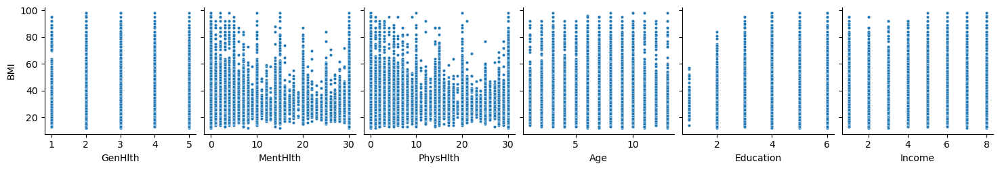

In [9]:
# Creamos gráficos de dispersión para nuestra única variable continua.
bmi= database['BMI']                                                                  # Cogemos nuestra características BMI en forma de serie de panda  
y_vars_db= non_binary_db.drop(['BMI'],axis=1)                                         # Cogemos un database de características no binarias y eliminamos BMI
# Utilizamos y_vars para establecer nuestra variable de interés (BMI) y  plot_kws para controlar los tamaños de los puntos
sns.pairplot(non_binary_db, y_vars=['BMI'], x_vars=y_vars_db, height=2.5, plot_kws={'s': 10}) 
plt.show()    


Igualmente, aunque tengamos una variable continua, podemos observar que si nuestra otra variable es discreta y tiene muy poca ampilutd de valores, los gráficos de dispersión no sirve, ya que una frecuencia=1 de un rango de valores similares de BMI se representa igual que frecuencias muy elevadas.

De estas gráficas podemos sacar información solo de 'MentHlth' y 'PhysHlth'. Ambas características guardan una correlación muy similar con BMI. Tiene sentido ya que un mal estado físico puede desembocar en un mal estado mental más facilmente y viceversa.

Por tanto, vamos a crear **una matriz de correlación y  un mapa de calor de frecuencias.**



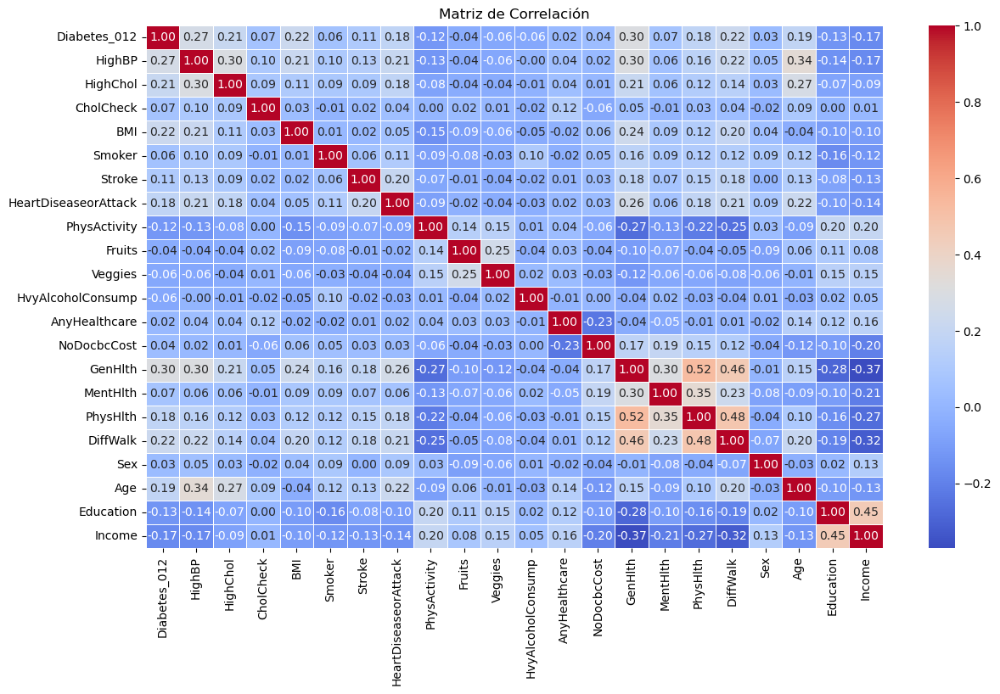

In [16]:
# Calculamos la matriz de correlación
correlation_matrix = database.corr()

# Creamos el mapa de calor
plt.figure(figsize=(14, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Matriz de Correlación")
plt.show()

La matriz de correlación muestra el coeficiente de correlación entre todas las variables. Este coeficiente mide la relación lineal entre las variables y tiene un rango de [-1,1]. Si el coeficiente es positivo, las variables son más directamente proporcionales según se acerquen al +1. Si es 0, no tienen relación. Y si es negativo, cuanto más se acerquen al -1 mas inversamente proporcionales serán.

Además, en nuestra matriz se puede observar por los colores también. 


##### **Mapa de calor de frecuencias:**

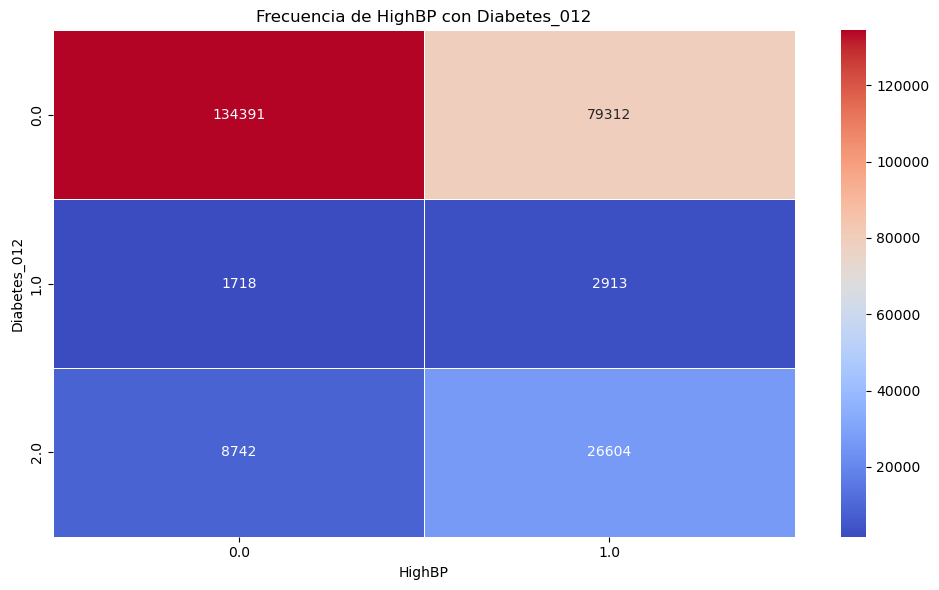

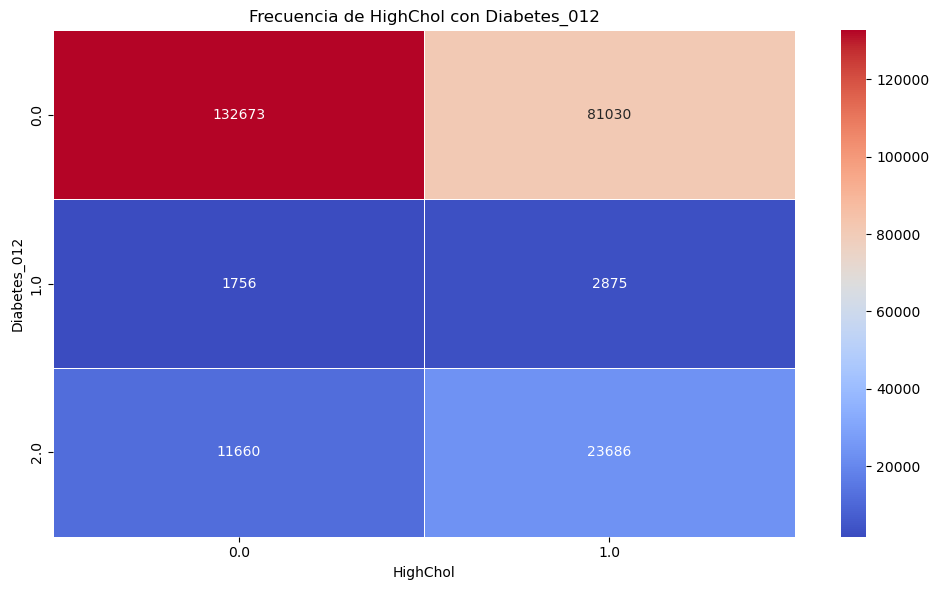

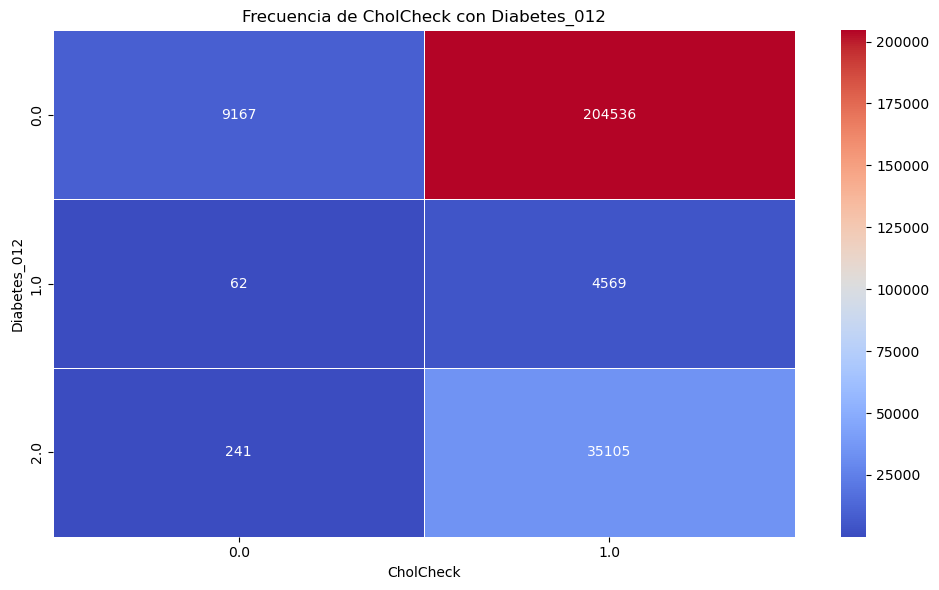

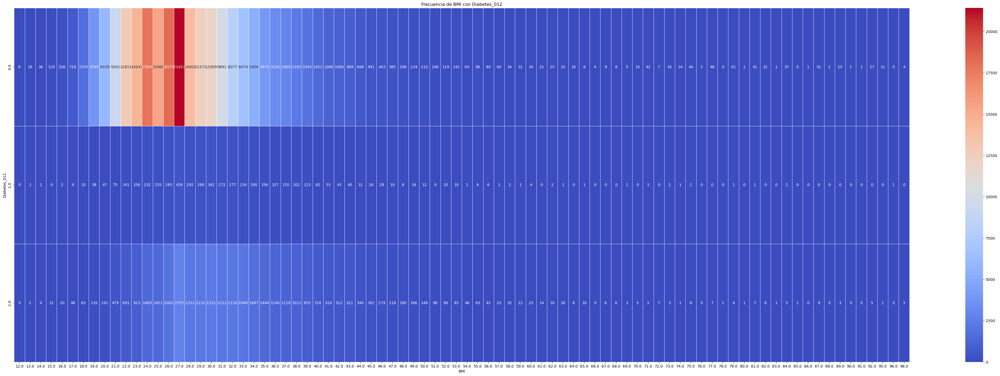

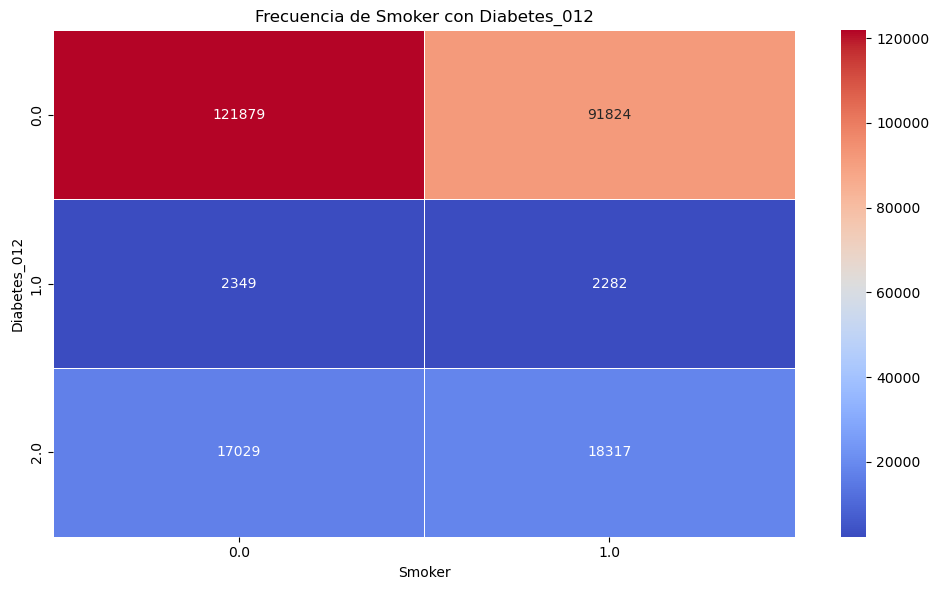

...

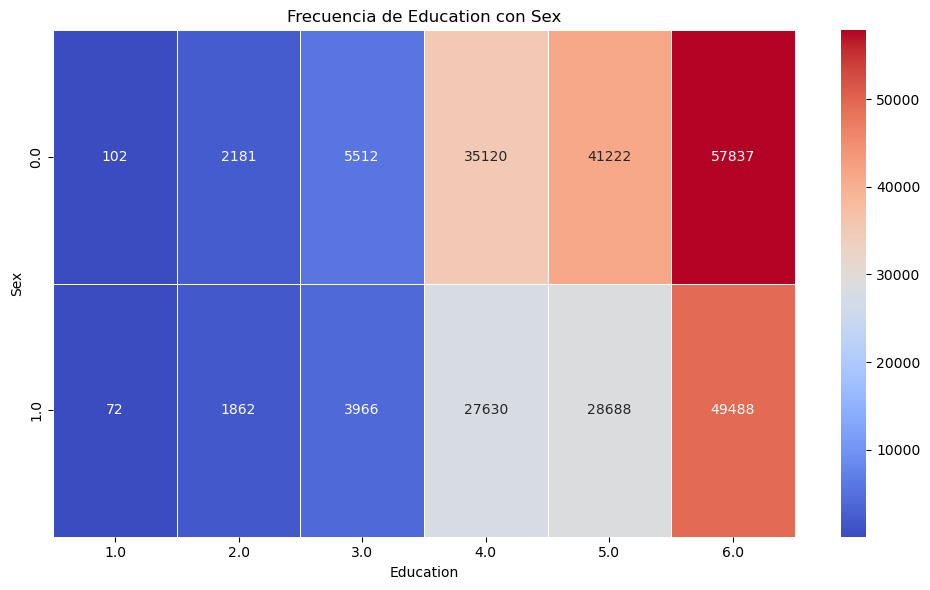

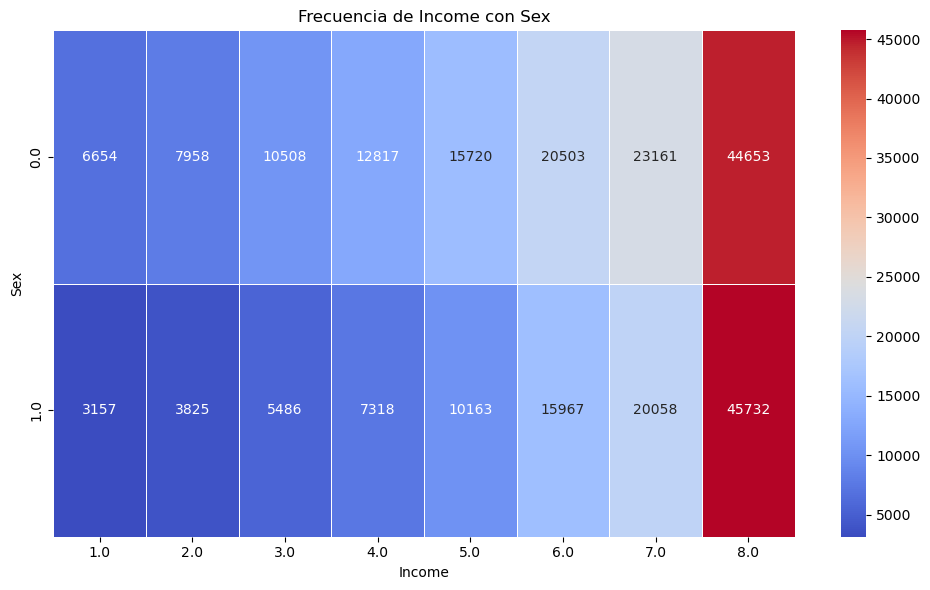

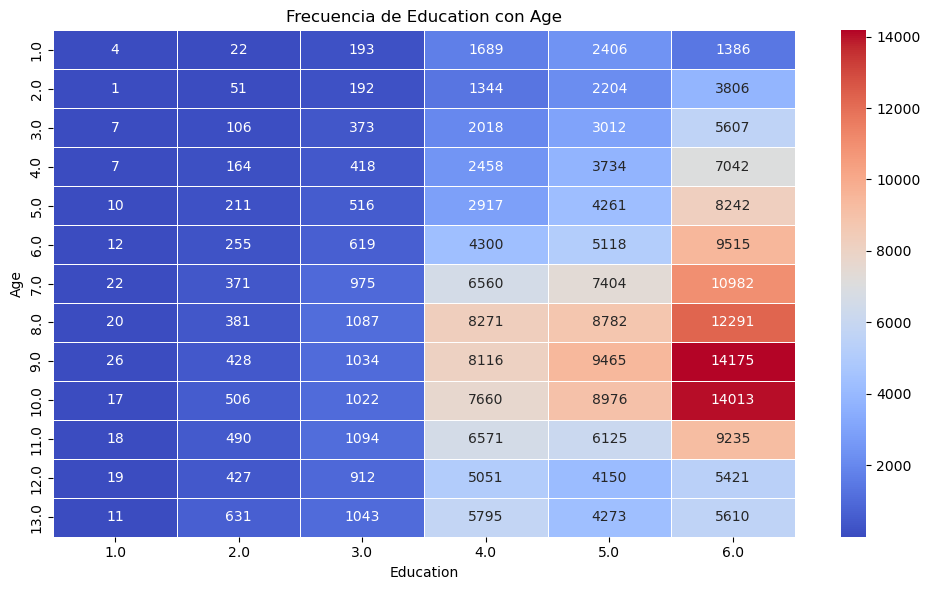

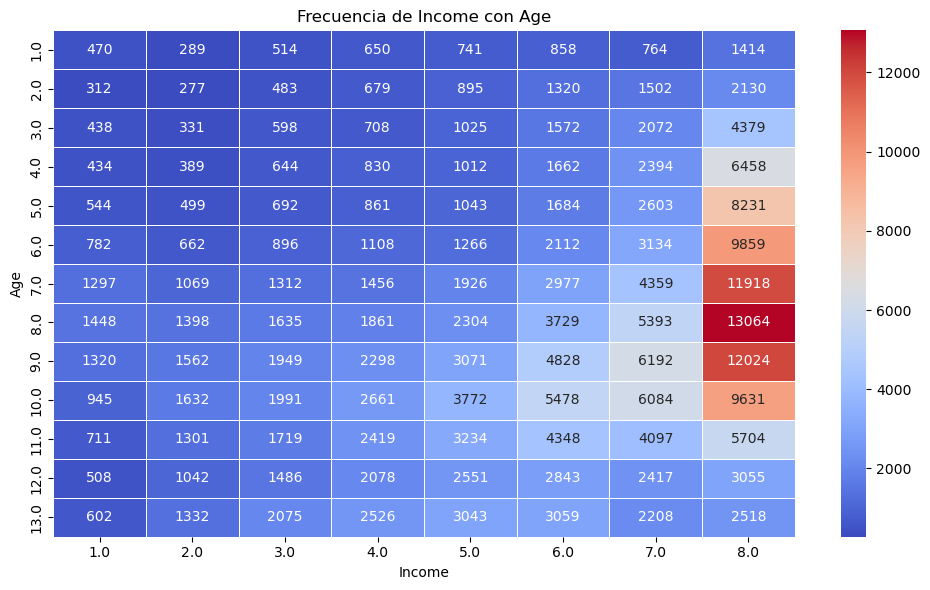

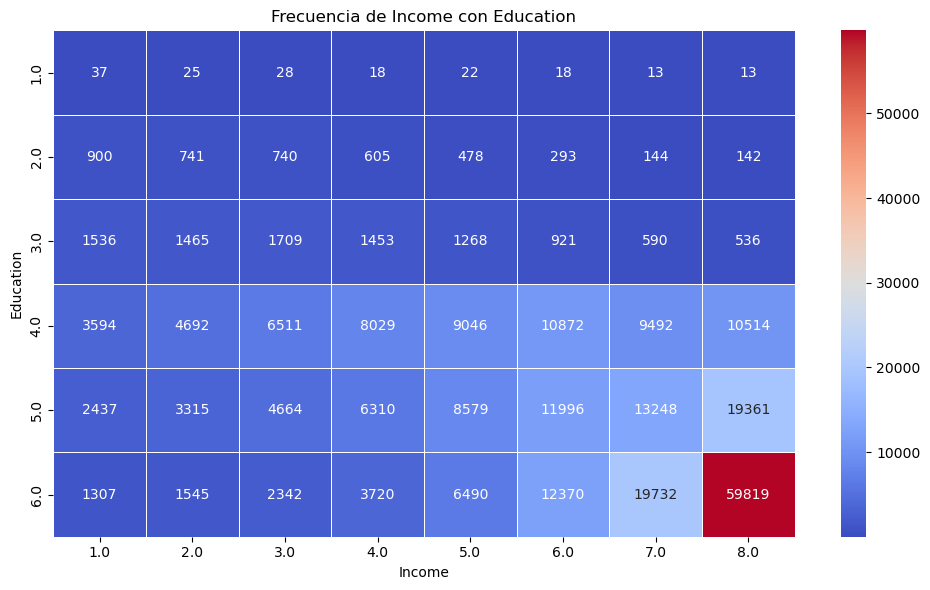

In [17]:
# Mostrar las tablas de frecuencias para cada variable

columns=database.columns

for i in range(len(columns)):                               # Para cada columna de mi database
    for j in range(i + 1, len(columns)):                    # Para cada columna+1 de mi database
        var1 = columns[i]                                   # Guardamos columna y la siguiente
        var2 = columns[j]
        freq_matrix = pd.crosstab(database[var1], database[var2])      # Creamos la tabla de frecuencias cruzadas entre ellas
        
        rango1=database[var1].max()-database[var1].min()               # Calculamos el rango de cada variable para poder represntar bien
        rango2=database[var2].max()-database[var2].min()
        # Crear un subplot 
        if rango1 > 40:                                                # Para las variables no binarias  y discretas mayor de 40                                                
            plt.figure(figsize=(rango1/6, rango1/6))                   # Numero de subplot son todas las combinaciones hechas 
        elif rango2  > 40:                                             
            plt.figure(figsize=(rango2/2, rango2/6))  
        else:
            plt.figure(figsize=(10,6))                               
        
        sns.heatmap(freq_matrix, annot=True, cmap="coolwarm", fmt="d", cbar=True, linewidths=0.5)   # Creamos el mapa de calor mostrando los valores

        plt.title(f"Frecuencia de {var2} con {var1}")
        plt.xlabel(var2)                 # Titulos y etiquetas
        plt.ylabel(var1)
        plt.tight_layout()
        plt.show()


Con estos mapas de calor podemos observar nuestra frecuencia de observaciones por cada par de características discretas. Nos muestran la correlación de las variables y nos ayudan a identificar patrones. 

Por ejemplo, podemos observar en la matriz de Diabetes_012 con PhysActivity (si han hecho deporte los últimos 30 dias) hay una fuerte correlación de gente deportista que no es diabética. Lo mismo pasa con Fruits (si toman mas de una pieza de fruta al día) y Veggies (si toman verduras mas de una vez al día).

Hay que tener en cuenta también que mucha frecuencia nos da pistas de posible correlación pero no nos lo asegura. Las clases están muy desbalanceadas y puede haber mucha frecuencia de un valor porque sea más habitual. Es el caso por ejemplo de Diabetes_012 con HvyAlcoholConsump. Como la gran mayoría no son consumidores graves de alcohol, salen muchos mas paciente no consumidores de alcohol y diabéticos, que consumidores graves de alcohol y diabéticos. No quiere decir que consumir alcohol pueda reducir la diabetes.
Es por esto que lo tenemos que valorar teniendo en cuenta el desbalanceo de clases.


### c) Represente las características en función de la salida deseada.

- **Boxplots**

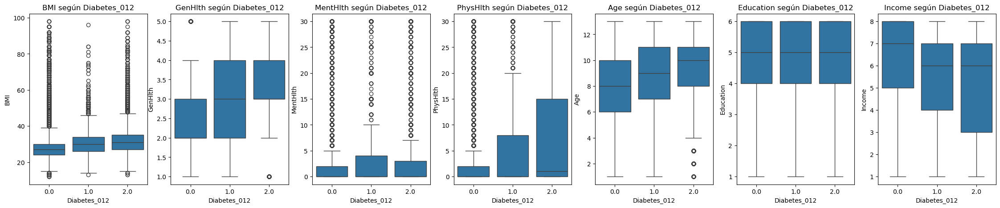

In [10]:
# Creamos los subplots 
target= 'Diabetes_012'
fig, axes = plt.subplots(nrows=1, ncols=len(non_binary_db.columns), figsize=(28, 5))   
data_represent= non_binary_db.join(database[target],how='outer')

for i,column in enumerate(non_binary_db.columns):                                # Excluimos 'Diabetes_012' en el bucle. Guardamos indice (i)
    sns.boxplot(x='Diabetes_012', y=column, data=data_represent,ax=axes[i])      # Pintamos cada característica personalizando los ejes gracia al índice
    axes[i].set_title(f'{column} según Diabetes_012') 
    axes[i].set_xlabel('Diabetes_012') 
    axes[i].set_ylabel(column)


plt.show()

Podemos ver que las medias de nuestras variables van incrementando según el grado de diabetes de nuestro paciente.Solo se reduce en "Income" ya que hay el valor máximo siginifica más poder adquisitivo, que se sabe que está relacionado con una mejor calidad de vidad, por lo que influye en la salud mental y física. Por tanto, también tiene sentido.
También, se puede ver muy bien como los pacientes como los pacientes diabéticos son los mayoritarios que han sufrido molestias físicas (PhysHlth). 
La educación (Education) sin embargo, se encuentra muy similar en todos los grupos. Por tanto, no guarda tanta correlación como las demas con la diabetes. Tiene la media muy alta ya que la mayoría de nuestros pacientes tienen un nivel medio-alto de educación.


- **Gráficos de dispersion**

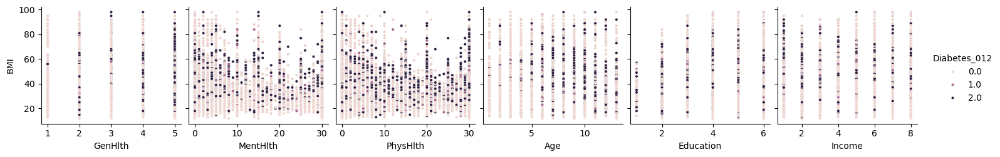

In [11]:
# Creamos gráficos de dispersión para nuestra única variable continua.
target='Diabetes_012'
bmi= database['BMI']                             # Cogemos nuestra características BMI en forma de serie de panda  
x_vars_db= non_binary_db.drop(['BMI'],axis=1)
                    
data_represent= non_binary_db.join(database[target],how='outer')
# Utilizamos y_vars para establecer nuestra variable de interés (BMI) y  plot_kws para controlar los tamaños de los puntos
sns.pairplot(data_represent, y_vars=['BMI'], x_vars=x_vars_db, height=2.5, plot_kws={'s': 10},hue=target) 
plt.show()

Podemos observar como para la diabetes una mala condición de salud física influye más que una mala condición de salud mental. Sin embargo, hay que volver a recalcar que los gráficos de dispersión no describen bien nuestras variables.

- **Represente las características de conjunto de entrenamiento y test.** <br>

- **De Xtrain**

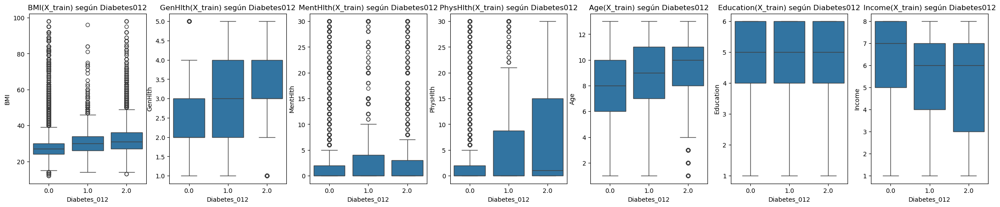

In [14]:
# Depuración de variables binarias

Xtrain_columns = X_train.select_dtypes(include=['float64']).columns                  # Seleccionamos todas las variables float
Xtrain_nb_columns = [col for col in Xtrain_columns if database[col].nunique() > 3]   # Cogemos las variables no binarias para representarlas
                                                                                                                       
Xtrain_nb_db= database[Xtrain_nb_columns]                                            # Se crea un database con valores no binarios
data_represent= Xtrain_nb_db.join(y_train, how='outer')                              # Se junta nuestras variables binarias con la salida.

fig, axes = plt.subplots(nrows=1, ncols=len(Xtrain_nb_db.columns), figsize=(28, 5)) 
for i,column in enumerate(Xtrain_nb_db.columns):                                # Recorremos todas las columnas de mi database. Guardamos indice (i)
    sns.boxplot(x='Diabetes_012', y=column, data=data_represent,ax=axes[i])     # Pintamos cada característica personalizando los ejes gracia al índice
    axes[i].set_title(f'{column}(X_train) según Diabetes012')                    
    axes[i].set_xlabel('Diabetes_012') 
    axes[i].set_ylabel(column)    


plt.show()

- **De X_test**

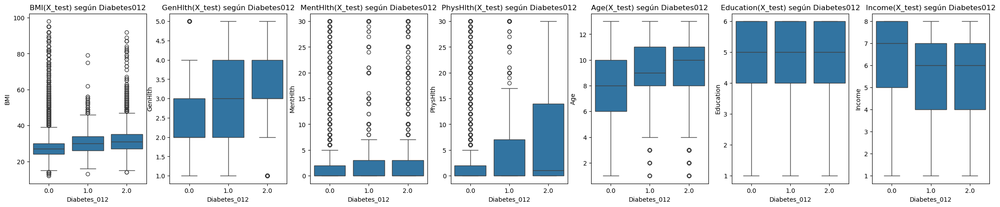

In [15]:
# Depuración de variables binarias
X_test_columns = X_test.select_dtypes(include=['float64']).columns                # Seleccionamos todas las variables float
Xtest_nb_columns = [col for col in numeric_columns if database[col].nunique() > 3]   # Cogemos las variables no binarias para representarlas
                                                                                                                      
Xtest_nb_db= database[Xtest_nb_columns]                                              
data_represent2= Xtest_nb_db.join(y_test, how='outer')                               # Se junta nuestras variables binarias con la salida.
    

fig, axes = plt.subplots(nrows=1, ncols=len(Xtrain_nb_db.columns), figsize=(28, 5)) 
for i,column in enumerate(Xtest_nb_db.columns):                                     # Recorremos todas las columnas de mi database. Guardamos indice (i)
    sns.boxplot(x='Diabetes_012', y=column, data=data_represent2,ax=axes[i])        # Pintamos cada característica personalizando los ejes gracia al índice
    axes[i].set_title(f'{column}(X_test) según Diabetes012')                    
    axes[i].set_xlabel('Diabetes_012') 
    axes[i].set_ylabel(column)    


plt.show()

### d) Preprocesado de datos <br>
**1) Valores atípicos:**    <br>
- Variables no binarias: <br>


In [16]:
#Calculamos los valores atípicos mediante z-score, ya que el rango intercuartílico identificaba valores posibles como outliers.

data_nb= non_binary_db                                         # Seleccionamos los datos numéricos no binarios (binarios y datos catgeóricos no)

z_scores = np.abs((data_nb - data_nb.mean()) / data_nb.std())  # Calcular el Z-score para cada columna en valor absoluto

threshold = 4.15                                               # Definimos un umbral muy estricto
outliers = z_scores > threshold                                # Identificamos los outliers 
  
for column in outliers.columns:                                # Imprimimos los outliers identificados
    non_null_outliers = data_nb[column][outliers[column]]      # Seleccionamos solo los valores de cada columna que son considerados outliers.
    if not non_null_outliers.empty:                            # Solo imprimimos las columnas que tienen outliers
        print(f"Outliers en '{column}':") 
        print((non_null_outliers))
        min_outliers= non_null_outliers.min() 
        print("Outlier con valor mínimo:", min_outliers)




Outliers en 'BMI':
670       59.0
1209      57.0
1754      57.0
2013      57.0
2278      58.0
          ... 
245737    57.0
249242    58.0
249875    63.0
252332    61.0
253330    60.0
Name: BMI, Length: 1188, dtype: float64
Outlier con valor mínimo: 56.0


Utilizamos Z-score ya que podemos ajustar nosotros el umbral, ya que con el método del rango intercuarílico nos consideraba outliers valores que si pueden ser posibles y comunes. Con Z-Score hemos aplicado una umbralización estricta (4.15) ya que en nuestra base de datos muchas características se han obtenido mediante encuesta por lo que son valores que si que aportan información y no queremos considerarlos outliers. <br>
Solo vamos a obtener outliers de la clase Índide de Masa Corporal (BMI) ya que hay valores que realmente no aportan más información puesto que son valores de BMI > 57 por lo que ya pertenecen a una clase (obesidad morbida extrema BMI>50) y son valores de pacientes muy críticos.

Tratamiento de estos outliers:
- En el caso de la característica de BMI (Body Mass Index), tenemos categorías diferentes. Asi que vamos a mantener los outlier en la clase que pertenecen (obesidad morbida extrema), pero con valores mas cercanos (50). <br>
Por tanto, aplicamos el método de truncamiento (winsorización):

El percentil del valor minimo de los outliers es 99.5533743298644 %


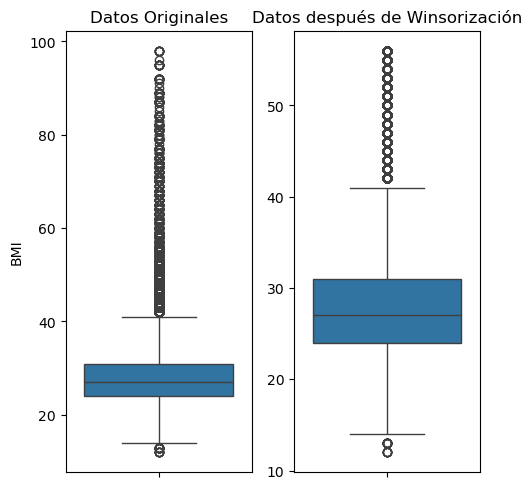

In [17]:
# Se aplica la función percentileofscore del outlier con el valor minimo

percentil = percentileofscore(data_nb['BMI'], min_outliers)
print(f"El percentil del valor minimo de los outliers es {percentil} %")

data_winsorize = winsorize(data_nb['BMI'], limits=[0, 1- percentil/100])       # Hacemos la winsorizacion con el percentil adecuado

fig, axes = plt.subplots(1, 2, figsize=(5, 5))                                 # Creamos un subplot con 2 columnas
sns.boxplot(data=data_nb['BMI'], ax=axes[0])                                   # Boxplot de los datos originales
axes[0].set_title('Datos Originales')

sns.boxplot(data=data_winsorize, ax=axes[1])                                   # Boxplot de los datos Winsorizados
axes[1].set_title('Datos después de Winsorización')              

plt.tight_layout()                                                             # Ajustamos la disposición y mostrar el gráfico
plt.show()


- **Variables binarias:**

In [18]:
binary_data = database.drop(data_nb,axis=1)             # Quitamos las variables binarias
for column in binary_data:
    if column== "Diabetes_012":
        if database[column].nunique(dropna=True)>3:
            print("Hay outliers")
        else:
            print(f"La columna {column} no tiene outliers")
    else:
        if database[column].nunique(dropna=True)>2:
            print("Hay outliers")
        else:
            print(f"La columna {column} no tiene outliers")
    

La columna Diabetes_012 no tiene outliers
La columna HighBP no tiene outliers
La columna HighChol no tiene outliers
La columna CholCheck no tiene outliers
La columna Smoker no tiene outliers
La columna Stroke no tiene outliers
La columna HeartDiseaseorAttack no tiene outliers
La columna PhysActivity no tiene outliers
La columna Fruits no tiene outliers
La columna Veggies no tiene outliers
La columna HvyAlcoholConsump no tiene outliers
La columna AnyHealthcare no tiene outliers
La columna NoDocbcCost no tiene outliers
La columna DiffWalk no tiene outliers
La columna Sex no tiene outliers


Se puede observar que no hay ninguna característica binaria con outliers.

**2.- Número de valores perdidos.**

In [18]:
database.isnull().sum()                                          #Podemos ver el número de valores nulos de esta manera.

Diabetes_012            0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

No hay valores perdidos

**3.- Clases desbalanceadas**

In [19]:
datagroup=database.groupby('Diabetes_012')      
length= datagroup.count()
print(length)


              HighBP  HighChol  CholCheck     BMI  Smoker  Stroke  \
Diabetes_012                                                        
0.0           213703    213703     213703  213703  213703  213703   
1.0             4631      4631       4631    4631    4631    4631   
2.0            35346     35346      35346   35346   35346   35346   

              HeartDiseaseorAttack  PhysActivity  Fruits  Veggies  ...  \
Diabetes_012                                                       ...   
0.0                         213703        213703  213703   213703  ...   
1.0                           4631          4631    4631     4631  ...   
2.0                          35346         35346   35346    35346  ...   

              AnyHealthcare  NoDocbcCost  GenHlth  MentHlth  PhysHlth  \
Diabetes_012                                                            
0.0                  213703       213703   213703    213703    213703   
1.0                    4631         4631     4631      4631     

Se puede observar que si estan muy desbalanceadas, siendo la clase no diabetica mayoritaria. La que apensas tiene es la prediabetica.

### e) Normalice su conjunto de observaciones

Solo vamos a tratar las variables no binarias, ya que las binarias ya se encuentran en el rango 0-1. 
Para tratar las variables no binarias, vamos a utiizar Min-Max scale ya que queremos preservar la distribución original de los datos. 

In [19]:
scaler = MinMaxScaler()                                              # Llamamos a la función Min-Max Scaler

for column in non_binary_db.columns:                                 # Recorremos todas las columnas de nuestros datos no binarios
    database[[column]] = scaler.fit_transform(database[[column]])    # Aplicamos el min max scale y actualizamos esa columna en nuestra base de datos


print(database)
    
    

        Diabetes_012  HighBP  HighChol  CholCheck       BMI  Smoker  Stroke  \
0                0.0     1.0       1.0        1.0  0.325581     1.0     0.0   
1                0.0     0.0       0.0        0.0  0.151163     1.0     0.0   
2                0.0     1.0       1.0        1.0  0.186047     0.0     0.0   
3                0.0     1.0       0.0        1.0  0.174419     0.0     0.0   
4                0.0     1.0       1.0        1.0  0.139535     0.0     0.0   
...              ...     ...       ...        ...       ...     ...     ...   
253675           0.0     1.0       1.0        1.0  0.383721     0.0     0.0   
253676           2.0     1.0       1.0        1.0  0.069767     0.0     0.0   
253677           0.0     0.0       0.0        1.0  0.186047     0.0     0.0   
253678           0.0     1.0       0.0        1.0  0.127907     0.0     0.0   
253679           2.0     1.0       1.0        1.0  0.151163     0.0     0.0   

        HeartDiseaseorAttack  PhysActivity  Fruits 

Ahora, vamos a  visualizar nuestro database normalizado:

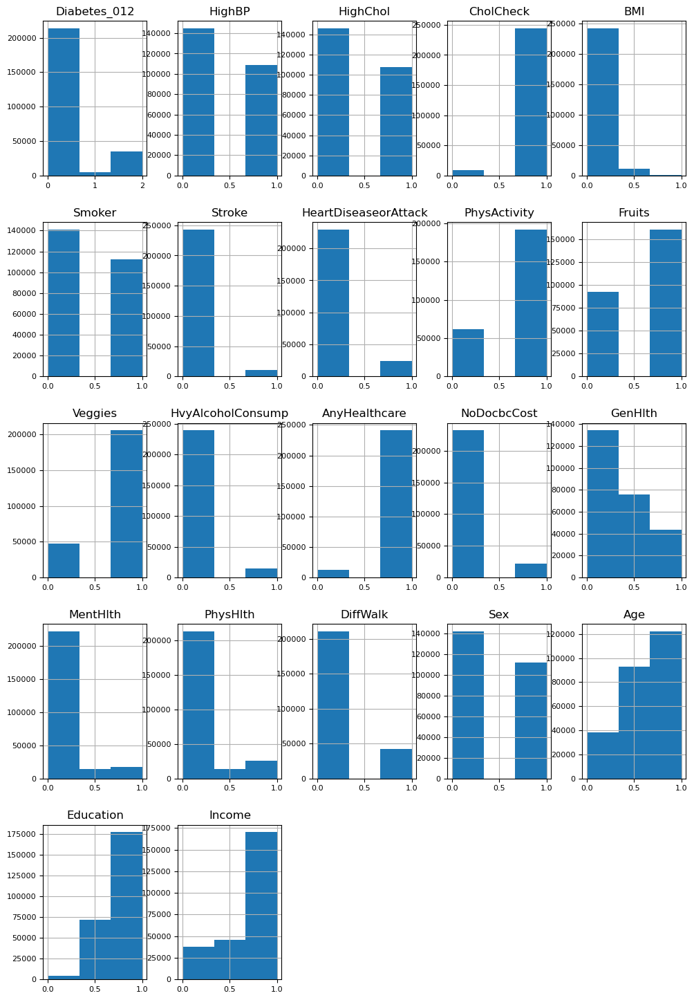

In [20]:
database.hist(figsize=(12,18), bins=3, xlabelsize=8, ylabelsize=8)
plt.axis('off')
plt.show()

# Guardamos el archivo.
database.to_csv('database_preprocesada.csv', index=False)

---------

##### Como Diabetes_012 es una variable categórica, se trata de un problema de clasificación, no de regresión.

## Tema 2 - Regresión paramétrica

### a) Regresión lineal simple

- ¿Cuál es la variable dependiente que podrías considerar para abordar un problema de regresión lineal??

En un problema de regresión, nuestra variable de salida no puede ser Diabetes_012 ya que es una variable discreta. Por tanto, tenemos que buscar una variable continua para que pueda ser nuestra variable dependiente. En nuestro caso, vamos a elegir **'BMI' (Body Mass Index)** debido a que es una variable continua.

Hay que recalcar que como la mayoría de nuestras variables son categóricas, por lo que nuestro regresor lineal no va a funcionar idealmente

- ¿Qué variable es la que permite una mejor estimación de la variable dependiente? 
Puedes ayudarte del valor del coeficiente de correlación, así como de algunas figuras de mérito que consideres adecuadas para evaluar el rendimiento del regresor.

Volvemos a recordar nuestra matriz de corrleación para darnos una ayuda previa de que variables tienen mas dependencia.

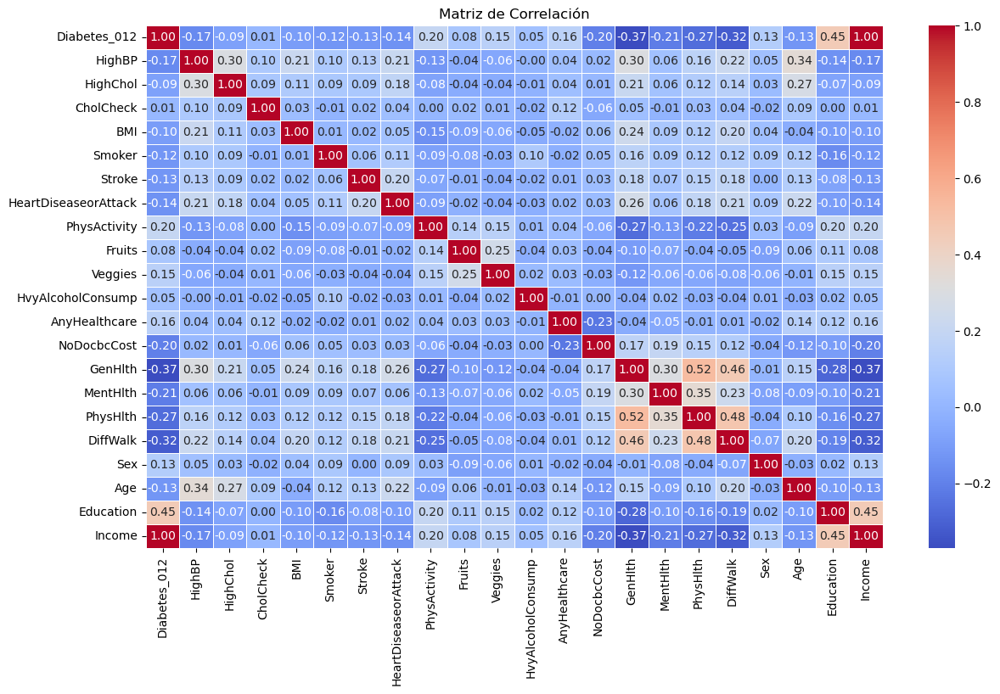

In [29]:
# Calculamos la matriz de correlación
correlation_matrix = database.corr()

# Creamos el mapa de calor
plt.figure(figsize=(14, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Matriz de Correlación")
plt.show()

Si nos fijamos en la matriz de correlación, y considerando ahora BMI como nuestra variable de salida, tenemos que el coeficiente de correlación más cercano a 1 es el de la variable 'GenHlth' con un valor de r=0.24. 'GenHlth' es una variable que mide en una escala del 1 al 5, como considera el paciente su estado de salud en general. Por tanto, tiene sentido que sea la variable que más correlada esté.
También podemos observar que 'HighBP' (High Blood Pressure) también esta bastante correlada (r=0.21) debido a que una BMI muy alta puede desarrollar más facilmente hipertensión en nuestros pacientes.

Aplicando ahora el regresor lineal simple:

In [30]:
data_input = database.drop(['BMI'],axis=1)       # Seleccionamos GenHlth ya que es la que mas correlada está
data_output= database['BMI']                        # Nuestra salida ahora es BMI

# Cortamos nuestro dataset en training (70% de las observaciones) y test (30% de las observaciones)
X_train, X_test, y_train, y_test = train_test_split(data_input, data_output, test_size=0.3, random_state=42) # Generador de numeros aleatorios.

# Definimos las figuras de mérito que posteriormente utilizamos.
r2_results=[]
mse_results=[]
mae_results=[]
rmse_results=[]

reg = LinearRegression()                                             # Llamamos a la función de regresión lineal.                                                      
reg = reg.fit(np.array(X_train['GenHlth']).reshape(-1,1), y_train)   # reshape(-1=número de filas = original, 1= solo una columna)

print(f"El valor del intercepto es : {reg.intercept_}")          # Mostramos el valor del intercepto= (0,b0)                                               
print(f"El valor del coeficiente es: {reg.coef_}")               # Mostramos el valor del coeficientes(b1): y=b0+b1x

# Obtenemos el valor predicho para el conjunto de test    
y_pred= reg.predict(np.array(X_test['GenHlth']).reshape(-1,1)) 

# MAE.Mide el error medio absoluto, es decir, el error promedio de nuestro modelo.
mae=metrics.mean_absolute_error(y_test,y_pred)
mae_results.append(mae)

# MSE. Penaliza errores grandes más severamente que el MAE debido al cuadrado de las diferencias.
mse=metrics.mean_squared_error(y_test,y_pred)
mse_results.append(mse)

# R^2. Mide qué tan bien se ajustan los valores predichos a los valores reales en un modelo de regresión.
r_squared=metrics.r2_score(y_test,y_pred)
r2_results= []
r2_results.append(r_squared)

print(f'R Squared: {r_squared} \nError Medio Cuadrático : {mse} \n Error Medio Absoluto: {mae}')


El valor del intercepto es : 0.16454936989065366
El valor del coeficiente es: [0.06852719]
R Squared: 0.05863929073919383 
Error Medio Cuadrático : 0.005511657127679159 
 Error Medio Absoluto: 0.052867731373260424


- El intercepto es el valor de la variable dependiente cuando todas las variables independientes tienen valor 0.
- El coeficiente mide cuánto cambia la variable dependiente por cada unidad de cambio en la variable independiente.

Como podemos observar, el regresor no está teniendo el mejor rendimiento:

- Un R Squared tan cercano al 0 nos indica que nuestro modelo no explica la variabilidad de la variable dependiente.
- Un MSE alto indica que es un modelo con un mal ajuste, ya que tienen un valor alto de errores, indicando que las predicciones están alejadas de los valores reales. En nuetsro caso, es bajo, pero como R^2 es bajo, no nos indica que es un buen modelo.
- Un MAE bajo indica que nos estamos equivocando poco. Sin embargo, si tenemos en cuenta el valor de R^2 que es muy bajo, nos indica muy malos resultados.



- Indique si las prestaciones obtenidas en el conjunto de test cambia después de normalizar las variables:

In [31]:
# Aplicamos de nuevo la misma normalización utilizada en la Introducción
scaler = MinMaxScaler()                                                 # Llamamos a la función Min-Max Scaler                                                                 
database[['GenHlth']] = scaler.fit_transform(database[['GenHlth']])     # Aplicamos el min max scale y actualizamos esa columna en nuestra base de datos
database[['BMI']] = scaler.fit_transform(database[['BMI']])

# Regresor lineal
data_input = database.drop(['BMI'],axis=1)       # Eliminamos de los datos de entrada la columna de BMI 
data_output= database['GenHlth']                 # Nuestra salida ahora es BMI              

X_train, X_test, y_train, y_test = train_test_split(data_input, data_output, test_size=0.3, random_state=42) 

r2_results=[]
mse_results=[]
mae_results=[]

reg = LinearRegression()                                             # Llamamos a la función de regresión lineal.                                                      
reg = reg.fit(np.array(X_train['GenHlth']).reshape(-1,1), y_train)   
print(f"El valor del intercepto es : {reg.intercept_}")              # Mostramos el valor del intercepto= (0,b0)                                               
print(f"El valor del coeficiente es: {reg.coef_}")                   # Mostramos el valor del coeficiente(b1): y=b0+b1x

# Obtenemos el valor predicho para el conjunto de test    
y_pred= reg.predict(np.array(X_test['GenHlth']).reshape(-1,1)) 
y_train_pred = reg.predict(np.array(X_train['GenHlth']).reshape(-1,1))                               # Y para el de entrenamiento
        
mae=metrics.mean_absolute_error(y_test,y_pred)                # MAE.
mae_results.append(mae)
mse=metrics.mean_squared_error(y_test,y_pred)                 # MSE
mse_results.append(mse)
r_squared=metrics.r2_score(y_test,y_pred)                     # R^2
r2_results.append(r_squared)

# Figuras de mérito train
mae_train_L=metrics.mean_absolute_error(y_train,y_train_pred)                # MAE
mse_train_L=metrics.mean_squared_error(y_train,y_train_pred)                 # MSE
r2_train_L=metrics.r2_score(y_train,y_train_pred)                            # R^2

print(f'R Squared: {r_squared} \nError Medio Cuadrático : {mse} \nError Medio Absoluto: {mae}')


El valor del intercepto es : 1.6114887202434147e-13
El valor del coeficiente es: [1.]
R Squared: 1.0 
Error Medio Cuadrático : 1.2930064627044613e-26 
Error Medio Absoluto: 9.571634178104636e-14


Al normalizar las variables, nos encontramos unos resultados mucho más positivos, pero nos indica un sobreajuste maximo

- El coeficiente=1 nos indica que hay una relación perfectamente lineal entre las variables.
- El R^2=1 indica que el modelo explica el 100% de la variabilidad de y.
- Ahora, tenemos errores MSE Y MAE muy bajos.

En conclusión, estos resultados nos indica un rendimiento muy alto pero con mucho sobreajuste. Estos valores puede ser en consecuencia de haber seleccionado la variable correlada y encima haberla normalizado.

### b) Regresión lineal múltiple

- Explique cómo cambia el valor de los estimadores, el coeficiente de correlación y las figuras de mérito cuando cambiamos el número de variables explicativas.

En cuanto a los estimadores (intercepto y coeficientes), un cambio en el número de variables explicativas implica un cambio en sus valores. Cuando tenesmos menos por ejemplo, los coeficientes restantes estarán más sesgados debido a la omisión de variables importantes.

En cuanto a R^2, va aumentar generalmente si aumentamos el numero de variables explicativas. Si las disminuimos y R^2 no cambia, podemos ver que las variables omitidas eran irrelevantes.

En cuanto al MSE Y MAE, suelen tner valores más bajos si aumentamos el número de variables explicativas, puesto que se ajustan mejor a los datos de entrenamiento. Sin embargo, esto puede llevar al sobreajuste.

- Explique detalladamente el proceso seguido y justifique qué características son las más relevantes en esta base de datos. 

In [32]:
data_input = database.drop(['BMI'],axis=1)       # Eliminamos de los datos de entrada la columna de BMI 
data_output= database['BMI']                     # Nuestra salida ahora es BMI

# Cortamos nuestro dataset en training (70% de las observaciones) y test (30% de las observaciones)
X_train, X_test, y_train, y_test = train_test_split(data_input, data_output, test_size=0.3, random_state=42) # Generador de numeros aleatorios.

# Definimos las figuras de mérito que posteriormente utilizamos.
r2_results=[]
mse_results=[]
mae_results=[]
rmse_results=[]


# Iterativamente eliminamos variables y evaluamos

remaining_var = data_input.columns.tolist()                        # Hacemos una lista de las variables explicativas

while len(remaining_var) > 1:                                      # Mientras queden variables explicativas:    
    current_metrics = []
    for var in remaining_var:                                      # Para las variables dentro de las que quedan
        
        temp_features = [f for f in remaining_var if f != var]     
        X_train_temp = X_train[temp_features]
        X_test_temp = X_test[temp_features]
        
        reg = LinearRegression()                                         # Llamamos a la función de regresión lineal.                                                      
        reg = reg.fit(X_train_temp, y_train)                             # Aplicamos la función

        intercepto=reg.intercept_                                        # Recogemos el valor del intercepto= (0,b0)                                               
        coeficientes= reg.coef_                                          # Recogemos los valores de los coeficientes(b1 etc..): y=b0+b1x...                                   )                                               
    
        # Obtenemos el valor predicho para el conjunto de test    
        y_pred= reg.predict(X_test_temp)
        
        # Figuras de mérito test
        mse_LR=metrics.mean_squared_error(y_test,y_pred)                 # MSE
        mae_LR=metrics.mean_absolute_error(y_test,y_pred)                # MAE
        r2_LR=metrics.r2_score(y_test,y_pred)                            # R^2
        
        
        
        
        current_metrics.append((var,mse_LR, mae_LR, r2_LR))
    current_metrics.sort(key=lambda x: x[1])                      # Ordenamos las métricas por MSE (menor es mejor)
    least_important_var = current_metrics[0][0]                   # Seleccionamos la variable con el menor rendimiento
    remaining_var.remove(least_important_var)                     # Eliminamos esa variable 
                                       
    # Imprimir el progreso
    print(f"El valor del intercepto es : {reg.intercept_}")               # Mostramos el valor del intercepto= (0,b0)                                               
    print(f"Los valores de los coeficientes son: {reg.coef_}")            # Mostramos los valores de los coeficientes(b1 etc..): y=b0+b1x...                                   )                                               
    print(f"Eliminando la variable: {least_important_var}")
    print(f"Métricas actualizadas MSE={current_metrics[0][1]}, MAE={current_metrics[0][2]}, R2={current_metrics[0][3]}")

print(f"La variable mas explicativa es {remaining_var[0]}")

El valor del intercepto es : 0.1953637917251043
Los valores de los coeficientes son: [ 0.00454194  0.02840404  0.00724105  0.00802741 -0.00477946 -0.01214527
 -0.00570596 -0.01335176 -0.00626161 -0.00025359 -0.01391929  0.0008746
  0.00165115  0.04325829 -0.00122022 -0.0115919   0.02600761  0.00597744
 -0.04531084 -0.01104495]
Eliminando la variable: NoDocbcCost
Métricas actualizadas MSE=0.005140818774382137, MAE=0.05076855533750427, R2=0.12197644092723348
El valor del intercepto es : 0.1961108795360232
Los valores de los coeficientes son: [ 0.00435183  0.02841265  0.00725495  0.00795746 -0.00476281 -0.01213473
 -0.0056943  -0.01334425 -0.00626772 -0.00024381 -0.01391478  0.00047751
  0.04336542 -0.00104165 -0.01152038  0.02604172  0.00594902 -0.04553989
 -0.01102417]
Eliminando la variable: MentHlth
Métricas actualizadas MSE=0.005140752098418518, MAE=0.0507675041160852, R2=0.12198782881493186
El valor del intercepto es : 0.1959179720705066
Los valores de los coeficientes son: [ 0.0044

Como se puede observar las variables más explicativas para BMI son  GenHlth, HighBP,Age y Diabetes_012. Tiene mucho sentido, ya que todas tienen que ver con la obesidad.

- El intercepto va cambiando porque el modelo se tiene que ir ajustando a los cambios en el número de variables
  
- Como se puede observar cuando disminuimos el número de variables explicativas, las figuras de mérito aumentan ligeramente. Este cambio no es significativo, ya que las variables eliminadas no eran tan importantes.

- El valor de R² no fluctua mucho y es muy bajo, lo que indica que el modelo no está explicando gran parte de la variabilidad en la variable dependiente y que la eliminación de estas variables no cambia mucho.

### c) Regresión no lineal

Incluya qué funciones no lineales (logarítmica, inversa, cuadrática, cúbica, de potencia, exponencial, etc.) se ajustan mejor a los datos disponibles. 

        Modelo        MSE       MAE        R²
0   Cuadrático  40.580035  4.539509  0.062893
1       Cúbico  40.540581  4.536784  0.063804
2  Exponencial  40.812515  4.550494  0.057524
3  Logarítmico  40.636545  4.541809  0.061588


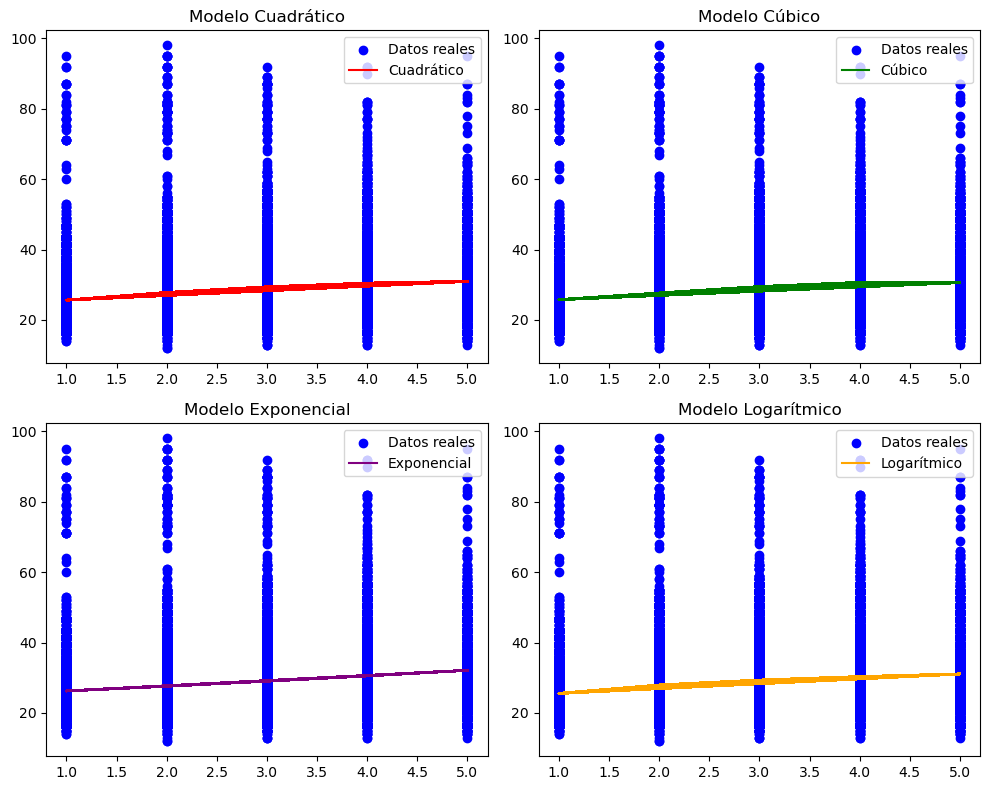

In [49]:
# Cogemos las mejores variables 
data_input= database['GenHlth']
data_output= database['BMI']
# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(data_input, data_output, test_size=0.3, random_state=42)
                             
# Funciones de regresión no lineales
def quadratic_model(x, a, b, c):                         # Función cuadrática
    return a * x**2 + b * x + c

def cubic_model(x, a, b, c, d):                          # Funcion cúbica
    return a * x**3 + b * x**2 + c * x + d

def exponential_model(x, a, b):                          # Función exponencial
    return a * np.exp(b * x)

def logarithmic_model(x, a, b):                          # Función logarítmica
    return a * np.log(b * x)

# Ajustamos los modelos no lineales con la función curve_fit
params_quad, _ = curve_fit(quadratic_model, X_train, y_train)         # Cogemos los parámetros del modelo cuadrático
y_pred_quad = quadratic_model(X_test, *params_quad)                   # Predecimos los valores

# Ajustamos el modelo cúbico
params_cubic, _ = curve_fit(cubic_model,X_train, y_train)            # Cogemos los parámetros del modelo cúbico
y_pred_cubic = cubic_model(X_test, *params_cubic)

# Ajustamos el modelo exponencial
params_exp, _ = curve_fit(exponential_model, X_train, y_train)       # Cogemos los parámetros del modelo exponencial
y_pred_exp = exponential_model(X_test, *params_exp)

# Ajustamos el modelo logarítmico
params_log, _ = curve_fit(logarithmic_model, X_train, y_train)       # Cogemos los parámetros del modelo logarítmico
y_pred_log = logarithmic_model(X_test, *params_log)

# Calculamos las métricas para cada modelo
models = ['Cuadrático', 'Cúbico', 'Exponencial', 'Logarítmico']                # Nombres de los modelos
predictions = [y_pred_quad, y_pred_cubic, y_pred_exp, y_pred_log]              # Lista de prediccioones

current_metrics = []                                                           # Lista para guardar las métricas
 
for i, y_pred in enumerate(predictions):                                       # Iteramos guardando índice y la predicciones          
    mse = metrics.mean_squared_error(y_test, y_pred)                           # MSE
    mae = metrics.mean_absolute_error(y_test, y_pred)                          # MAE
    r2 = metrics.r2_score(y_test, y_pred)                                      # R^2
    current_metrics.append([models[i], mse, mae, r2])    

# Mostramos los resultados de las métricas
metrics_df = pd.DataFrame(current_metrics, columns=['Modelo', 'MSE', 'MAE', 'R²'])
print(metrics_df)

# Visualizamos las predicciones de los modelos
plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.scatter(X_test, y_test, label='Datos reales', color='blue')          # Puntos
plt.plot(X_test, y_pred_quad, label='Cuadrático', color='red')           # Función 
plt.title('Modelo Cuadrático')
plt.legend()

plt.subplot(2, 2, 2)
plt.scatter(X_test, y_test, label='Datos reales', color='blue')
plt.plot(X_test, y_pred_cubic, label='Cúbico', color='green')
plt.title('Modelo Cúbico')
plt.legend()

plt.subplot(2, 2, 3)
plt.scatter(X_test, y_test, label='Datos reales', color='blue')
plt.plot(X_test, y_pred_exp, label='Exponencial', color='purple')
plt.title('Modelo Exponencial')
plt.legend()

plt.subplot(2, 2, 4)
plt.scatter(X_test, y_test, label='Datos reales', color='blue')
plt.plot(X_test, y_pred_log, label='Logarítmico', color='orange')
plt.title('Modelo Logarítmico')
plt.legend()

plt.tight_layout()
plt.show()



- En ocasiones, segun sea la partición aleatoria, no encuentra ni solución. Se ve por tanto que no es el mejor modelo que aplicar.
- Como podemos observar, la interpretación gráfica se pierde al tener variables discretas. 
- Si nos fijamos en las figuras de mérito, el mejor método es el cúbico.

### d) Regresión lineal con regularización

La regresión lineal con regularización es una técnica que ayuda a evitar el sobreajuste (overfitting) al penalizar los modelos complejos.
Existen dos tipos comunes de regularización en regresión lineal:



- **Indique si las figuras de mérito obtenidas en el conjunto de test cambian al cambiar la regularización considerada. Explore la regresión Ridge, LASSO o Elastic net.**

- Ridge (Regresión L2): Penaliza la magnitud de los coeficientes, pero no los elimina por completo.

In [50]:
data_input = database.drop(['BMI'],axis=1)       # Eliminamos de los datos de entrada la columna de BMI 
data_output= database['BMI']                     # Nuestra salida ahora es BMI
Ridge_metrics=[]

X_train, X_test, y_train, y_test = train_test_split(data_input, data_output, test_size=0.3, random_state=42)

# Creamos el modelo de regresión Ridge
ridge_model = Ridge(alpha=1.0)                  # alpha es el parámetro de regularización (λ)
ridge_model.fit(X_train, y_train)               # Ajustamos el modelo a los datos de entrenamiento

y_test_pred = ridge_model.predict(X_test)            # Hacemos predicciones de test y train
y_train_pred= ridge_model.predict(X_train)            

mse_R=metrics.mean_squared_error(y_test,y_test_pred)                 # MSE
mae_R=metrics.mean_absolute_error(y_test,y_test_pred)                # MAE
r2_R=metrics.r2_score(y_test,y_test_pred)                            # R^2

# Figuras de mérito train
mae_train_R=metrics.mean_absolute_error(y_train,y_train_pred)          # MAE
mse_train_R=metrics.mean_squared_error(y_train,y_train_pred)           # MSE
r2_train_R=metrics.r2_score(y_train,y_train_pred)                      # R^2
    
Ridge_metrics.append((mse_R, mae_R, r2_R))
print(f"Las métricas son MSE: {Ridge_metrics[0][0]} MAE: {Ridge_metrics[0][1]} R^2: {Ridge_metrics[0][2]}")    
print(f"Coeficientes del modelo: {ridge_model.coef_}")
print(f"El valor del intercepto es : {ridge_model.intercept_}")



Las métricas son MSE: 37.32101774637075 MAE: 4.316872252446905 R^2: 0.13815245126233133
Coeficientes del modelo: [ 1.35701704e+00  2.18410293e+00  4.52846840e-01  5.44338868e-01
 -3.86573475e-01 -1.12789615e+00 -6.67427896e-01 -1.10550043e+00
 -5.25168335e-01 -9.71579719e-03 -1.03272064e+00  4.44016080e-02
  1.47343263e-01  7.77794180e-01 -2.15932245e-03 -3.22969244e-02
  2.06256638e+00  4.56844884e-01 -3.39609125e-01 -1.73544442e-01
  7.24533958e-02]
El valor del intercepto es : 28.592004636109234


- Lasso (Regresión L1): Penaliza la magnitud de los coeficientes y puede reducir algunos coeficientes a cero, lo que lleva a una selección de variables.

In [51]:
# Creamos el modelo de regresión Lasso
lasso_model = Lasso(alpha=0.1)                  # alpha es el parámetro de regularización (λ)
lasso_model.fit(X_train, y_train)               # Ajustamos el modelo a los datos de entrenamiento

y_test_pred = lasso_model.predict(X_test)      # Hacemos predicciones
y_train_pred= lasso_model.predict(X_train)

Laso_metrics=[]
mae_LA=metrics.mean_absolute_error(y_test,y_test_pred)        # Evaluamos el modelo
mse_LA= metrics.mean_squared_error(y_test, y_test_pred)      # MSE                
r2_LA=metrics.r2_score(y_test,y_test_pred)                    # R^2
    
Laso_metrics.append((mse_LA, mae_LA, r2_LA))

# Figuras de mérito train
mae_train_LA=metrics.mean_absolute_error(y_train,y_train_pred)                # MAE
mse_train_LA=metrics.mean_squared_error(y_train,y_train_pred)                 # MSE
r2_train_LA=metrics.r2_score(y_train,y_train_pred)                            # R^2
    

print(f"Las métricas son MSE: {Laso_metrics[0][0]} MAE: {Laso_metrics[0][1]} R^2: {Laso_metrics[0][2]}")    
print(f"El valor del intercepto es : {lasso_model.intercept_}")
print(f"Coeficientes del modelo Lasso: {lasso_model.coef_}")

Las métricas son MSE: 37.76883062708871 MAE: 4.348748610179842 R^2: 0.12781118896978672
El valor del intercepto es : 28.442907240970182
Coeficientes del modelo Lasso: [ 1.27798163  1.84428901  0.08139783  0.         -0.         -0.
 -0.         -0.67274982 -0.19377639 -0.         -0.          0.
  0.          0.78872058 -0.         -0.0131269   1.0459498   0.02312579
 -0.29914318 -0.06862711  0.        ]


- Elastic Net es una combinación de las regularizaciones Lasso (L1) y Ridge (L2), que permite tanto la selección de variables (L1) como la regularización de los coeficientes (L2).

In [52]:
# Creamos el modelo ElasticNet, alpha es el parámetro de regularización global
elastic_net_model = ElasticNet(alpha=0.1, l1_ratio=0.5)  # l1_ratio controla la mezcla entre Lasso (L1) y Ridge (L2).

elastic_net_model.fit(X_train, y_train)                  # Ajustamos el modelo con los datos de entrenamiento
y_pred = elastic_net_model.predict(X_test)               # Hacemos predicciones en el conjunto de prueba
y_train_pred= elastic_net_model.predict(X_train)

EN_metrics=[]
# Evaluamos el modelo
mse_EN = metrics.mean_squared_error(y_test, y_pred)              # Evaluamos modelo de test
mae_EN=metrics.mean_squared_error(y_test,y_pred)                 # MSE
r2_EN=metrics.r2_score(y_test,y_pred)                            # R^2

EN_metrics.append((mse_EN,mae_EN,r2_EN))

# Figuras de mérito train
mae_train_E=metrics.mean_absolute_error(y_train,y_train_pred)                # MAE
mse_train_E=metrics.mean_squared_error(y_train,y_train_pred)                 # MSE
r2_train_E=metrics.r2_score(y_train,y_train_pred)                            # R^2
    
print(f"Las métricas son MSE: {EN_metrics[0][0]} MAE: {EN_metrics[0][1]} R^2: {EN_metrics[0][2]}")    
print(f"El valor del intercepto es : {elastic_net_model.intercept_}")
print(f"Coeficientes del modelo Lasso: {elastic_net_model.coef_}")

Las métricas son MSE: 37.68353288552035 MAE: 37.68353288552035 R^2: 0.12978095437069692
El valor del intercepto es : 28.757503795616806
Coeficientes del modelo Lasso: [ 1.24233547  1.63713517  0.28320402  0.         -0.13351895 -0.
 -0.         -0.73671673 -0.31887288 -0.         -0.06702093  0.
  0.          0.80562185  0.         -0.01409238  1.04984012  0.19294976
 -0.29680005 -0.13017423  0.01128774]


- **Justifique qué características son más relevantes en estos modelos.**

In [53]:
# Comparación entre Ridge, Lasso y Elastic Net

print(f"MSE para Ridge: {Ridge_metrics[0][0]}")
print(f"MSE para Lasso: {Laso_metrics[0][0]}")
print(f"MSE para Elastic Net: {EN_metrics[0][0]}")

print(f"MAE para Ridge: {Ridge_metrics[0][1]}")
print(f"MAE para Lasso: {Laso_metrics[0][1]}")
print(f"MAE para Elastic Net: {EN_metrics[0][1]}")

print(f"R^2 para Ridge: {Ridge_metrics[0][2]}")
print(f"R^2 para Lasso: {Laso_metrics[0][2]}")
print(f"R^2 para Elastic Net: {EN_metrics[0][2]}")


# Comparar los coeficientes
print(f"Coeficientes Ridge: {ridge_model.coef_}")
print(f"Coeficientes Lasso: {lasso_model.coef_}")
print(f"Coeficientes Elastic Net: {elastic_net_model.coef_}")


MSE para Ridge: 37.32101774637075
MSE para Lasso: 37.76883062708871
MSE para Elastic Net: 37.68353288552035
MAE para Ridge: 4.316872252446905
MAE para Lasso: 4.348748610179842
MAE para Elastic Net: 37.68353288552035
R^2 para Ridge: 0.13815245126233133
R^2 para Lasso: 0.12781118896978672
R^2 para Elastic Net: 0.12978095437069692
Coeficientes Ridge: [ 1.35701704e+00  2.18410293e+00  4.52846840e-01  5.44338868e-01
 -3.86573475e-01 -1.12789615e+00 -6.67427896e-01 -1.10550043e+00
 -5.25168335e-01 -9.71579719e-03 -1.03272064e+00  4.44016080e-02
  1.47343263e-01  7.77794180e-01 -2.15932245e-03 -3.22969244e-02
  2.06256638e+00  4.56844884e-01 -3.39609125e-01 -1.73544442e-01
  7.24533958e-02]
Coeficientes Lasso: [ 1.27798163  1.84428901  0.08139783  0.         -0.         -0.
 -0.         -0.67274982 -0.19377639 -0.         -0.          0.
  0.          0.78872058 -0.         -0.0131269   1.0459498   0.02312579
 -0.29914318 -0.06862711  0.        ]
Coeficientes Elastic Net: [ 1.24233547  1.6371

Lasso aplica la penalización L1, que tiende a forzar algunos de los coeficientes de las variables a cero, pudiendo eliminar características irrelevantes y dar relevancia a otras.

Ridge (l1_ratio=1) aplica penalización L2, que reduce la magnitud de los coeficientes pero no los lleva a cero. Por tanto, las variables con coeficientes más grandes (más alejados de cero) tienen un mayor impacto en la predicción

Elastic Net es útil cuando hay variables correlacionadas o cuando deseas mantener algunas variables mientras aplicas penalización a otras.

Por tanto,  Lasso y Elastic Net consideran importantes los coeficientes no nulos. Sin embargo, en Ridge, los coeficientes tienden a ser pequeños pero no cero, lo que indica una menor influencia pero no una eliminación total de la variable.

### e) Comparación de los resultados obtenidos con los diferentes modelos 

- Proporcione en una tabla las medidas de prestación obtenidas tanto en el conjunto de validación como en el de test para los diferentes modelos diseñados. 

In [54]:
# Creamos un DataFrame con los resultados
models = ['Linear Regression', 'Ridge', 'Lasso', 'Elastic Net']


validation_mse=[mse_train_L,mae_train_R,mae_train_LA,mae_train_E]
validation_mae=[mae_train_L,mse_train_R,mse_train_LA,mse_train_E]
validation_r2= [r2_train_L,r2_train_R, r2_train_LA,r2_train_E]

test_mse=[mse, mse_R,mse_LA ,mse_EN]
test_mae=[mae,mae_R,mae_LA ,mae_EN]
test_r2=[r_squared,r2_R,r2_LA , r2_EN]


results_df = pd.DataFrame({
    'Model': models,
    'Validation MSE': validation_mse,
    'Validation MAE': validation_mae,
    'Validation R²': validation_r2,
    'Test MSE': test_mse,
    'Test MAE': test_mae,
    'Test R²': test_r2
})

print(results_df)

               Model  Validation MSE  Validation MAE  Validation R²  \
0  Linear Regression    1.298052e-26    9.584629e-14       1.000000   
1              Ridge    4.324064e+00    3.769059e+01       0.140146   
2              Lasso    4.355269e+00    3.818460e+01       0.128876   
3        Elastic Net    4.346535e+00    3.810682e+01       0.130650   

    Test MSE   Test MAE   Test R²  
0  40.636545   4.541809  1.000000  
1  37.321018   4.316872  0.138152  
2  37.768831   4.348749  0.127811  
3  37.683533  37.683533  0.129781  


- Justifique razonadamente si utilizaría un esquema paramétrico lineal o no lineal. 
Indique y justifique el esquema que proporciona las mejores prestaciones en el conjunto de test. 

Utilizaríamos claramente un método lineal, ya que los métodos no lineales con variables discretas se comportan peor a la vista de las figuras de mérito. Es verdad que hemos seleccionado el metodo lineal normalizaod, que sobreajustaba mucho.

En todo caso, esta base de datos no es adecuada para resolver métodos de regresión.

- Indique y justifique si el hecho de realizar una única partición de los casos en los conjuntos de entrenamiento y test puede influir en los resultados obtenidos. 
Partiendo de los datos originales, realizar una nueva partición de los casos en los conjuntos de entrenamiento y test. Seleccione uno de los modelos analizados (indique los modelos elegidos) y obtenga de nuevo figuras de mérito. Comente los resultados obtenidos. 

In [55]:
data_input = database.drop(['BMI'],axis=1)       # Eliminamos de los datos de entrada la columna de BMI 
data_output= database['BMI']                     # Nuestra salida ahora es BMI

X_train, X_test, y_train, y_test = train_test_split(data_input, data_output, test_size=0.25, random_state=42)    # Hacemos otra partición nueva y de 0.25 en este caso

# Elegimos Lasso:
lasso_model = Lasso(alpha=0.1)                  # alpha es el parámetro de regularización (λ)
lasso_model.fit(X_train, y_train)               # Ajustamos el modelo a los datos de entrenamiento

y_test_pred = lasso_model.predict(X_test)      # Hacemos predicciones
y_train_pred= lasso_model.predict(X_train)

Laso_metrics=[]
mae_LA=metrics.mean_absolute_error(y_test,y_test_pred)        # Evaluamos el modelo
mse_LA= metrics.mean_squared_error(y_test, y_test_pred)      # MSE                
r2_LA=metrics.r2_score(y_test,y_test_pred)                    # R^2
    
Laso_metrics.append((mse_LA, mae_LA, r2_LA))

# Figuras de mérito train
mae_train_LA=metrics.mean_absolute_error(y_train,y_train_pred)                # MAE
mse_train_LA=metrics.mean_squared_error(y_train,y_train_pred)                 # MSE
r2_train_LA=metrics.r2_score(y_train,y_train_pred)                            # R^2

print(f"Las métricas para test son MSE: {Laso_metrics[0][0]} MAE: {Laso_metrics[0][1]} R^2: {Laso_metrics[0][2]}") 
print(f"Las métricas para train son MSE: {mse_train_LA} MAE: {mae_train_LA} R^2: {r2_train_LA}")
print(f"El valor del intercepto es : {lasso_model.intercept_}")
print(f"Coeficientes del modelo Lasso: {lasso_model.coef_}")

Las métricas para test son MSE: 37.91516098887678 MAE: 4.351875260889308 R^2: 0.12786940848227457
Las métricas para train son MSE: 38.10280199584634 MAE: 4.35314453354146 R^2: 0.12890793646838183
El valor del intercepto es : 28.454160860289786
Coeficientes del modelo Lasso: [ 1.27305992  1.84107044  0.09529563  0.         -0.         -0.
 -0.         -0.6620334  -0.19174017 -0.         -0.          0.
  0.          0.78697657 -0.         -0.01345959  1.05969593  0.03225153
 -0.29965699 -0.07264429  0.        ]


En este caso, los valordes de MSE Y MAE son similares para los conjuntos de entrenamiento y prueba, lo que sugiere que el modelo no está sobreajustando (overfitting) ni subajustando (underfitting).
El valor de R² cercano a 0 nos sigue indicando que el modelo no explica la variabilidad.

Todos los coeficientes son cero, por lo que esta fallando al eliminar todas las variables. Puede ser por un parámetro de regulación muy alto (alpha).

Se puede ver que hacer nuevas y diferentes particiones afecta a los resultados.

## Tema 3 - Clasificación paramétrica

In [61]:
data_input = database.drop(['Diabetes_012'],axis=1)              # Nuestro input van a ser todas las variables menos nuestra varaible de salida
data_output = database['Diabetes_012']                           # Nuestro output es la variable 'Diabetes_012'

# Cortamos nuestro dataset en training y test.
X_train, X_test, y_train, y_test = train_test_split(data_input, data_output, test_size=0.3, random_state=42) #Generador de numeros aleatorios.


### a) Regresión logística simple

La variable dependiente es la que intentamos clasificar, y en este caso es Diabetes_012. Esta variable indica el estado de diabetes), que es categórica y puede tomar varios valores, como "0", "1", y "2".

Evaluamos el rendimiento de un modelo de regresión logística simple, usando una variable predictiva a la vez, en términos de precisión (accuracy) y AUC-ROC. 

También graficamos cómo cambian estas métricas dependiendo de la variable predictiva. 

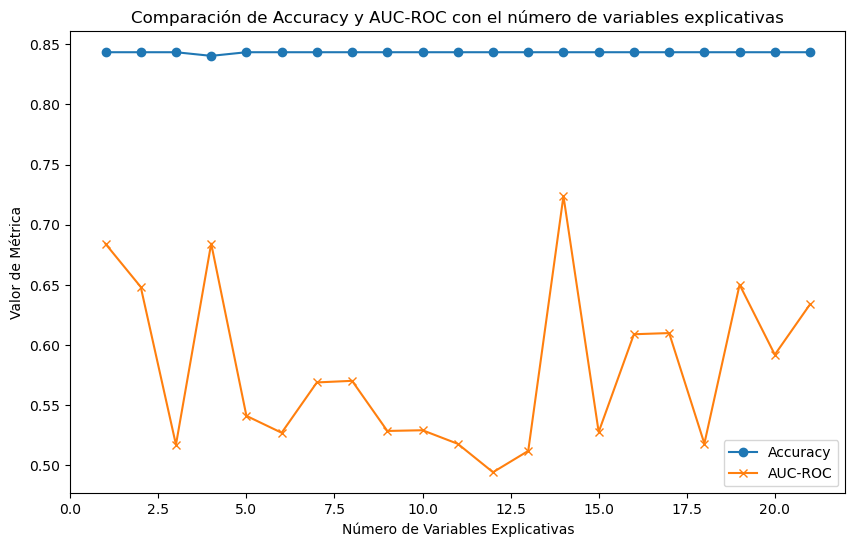

In [62]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Inicializar listas para almacenar resultados
results_accuracy = []
results_auc = []
variables = X_train.columns

# Iterar sobre todas las variables explicativas (una por una)
for column in variables:
    # Seleccionar una variable predictora
    X_train_col = X_train[[column]]
    X_test_col = X_test[[column]]
    
    # Ajustar un modelo de regresión logística
    model = LogisticRegression(multi_class='ovr', solver='liblinear')
    model.fit(X_train_col, y_train)
    
    # Predicciones y probabilidades
    y_pred = model.predict(X_test_col)
    y_pred_prob = model.predict_proba(X_test_col)
    
    # Calcular la precisión
    accuracy = accuracy_score(y_test, y_pred)
    
    # Calcular AUC-ROC para binarizar la clasificación
    y_test_bin = y_test.apply(lambda x: 1 if x > 0 else 0)
    y_pred_prob_bin = y_pred_prob[:, 1]  # Probabilidades para la clase positiva (1 o 2)
    auc_roc = roc_auc_score(y_test_bin, y_pred_prob_bin)
    
    # Guardar resultados
    results_accuracy.append(accuracy)
    results_auc.append(auc_roc)

# Graficar los resultados
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(variables) + 1), results_accuracy, label='Accuracy', marker='o')
plt.plot(range(1, len(variables) + 1), results_auc, label='AUC-ROC', marker='x')
plt.xlabel('Número de Variables Explicativas')
plt.ylabel('Valor de Métrica')
plt.title('Comparación de Accuracy y AUC-ROC con el número de variables explicativas')
plt.legend()
plt.show()

In [64]:
# Entrenamiento con todas las variables explicativas
model_all = LogisticRegression(multi_class='ovr', solver='liblinear')
model_all.fit(X_train_scaled, y_train)

# Predicciones y probabilidades con todas las variables
y_pred_all = model_all.predict(X_test_scaled)
y_pred_prob_all = model_all.predict_proba(X_test_scaled)

# Calcular precisión y AUC-ROC
accuracy_all = accuracy_score(y_test, y_pred_all)
y_test_bin_all = y_test.apply(lambda x: 1 if x > 0 else 0)
y_pred_prob_bin_all = y_pred_prob_all[:, 1]
auc_roc_all = roc_auc_score(y_test_bin_all, y_pred_prob_bin_all)

print(f'Precisión con todas las variables: {accuracy_all:.4f}')
print(f'AUC-ROC con todas las variables: {auc_roc_all:.4f}')

# Mostrar el AUC-ROC para cada variable explicativa individual
results = []
for column in X_train.columns:
    X_train_col = X_train[[column]]
    X_test_col = X_test[[column]]
    
    # Ajustar el modelo de regresión logística
    model = LogisticRegression(multi_class='ovr', solver='liblinear')
    model.fit(X_train_col, y_train)
    
    # Predicciones y probabilidades
    y_pred = model.predict(X_test_col)
    y_pred_prob = model.predict_proba(X_test_col)
    
    # Calcular AUC-ROC para la variable
    y_test_bin = y_test.apply(lambda x: 1 if x > 0 else 0)
    y_pred_prob_bin = y_pred_prob[:, 1]
    auc_roc = roc_auc_score(y_test_bin, y_pred_prob_bin)
    
    # Guardar los resultados
    results.append({'Variable': column, 'AUC-ROC': auc_roc})

# Convertir resultados a DataFrame
results_df = pd.DataFrame(results)

# Mostrar las variables ordenadas por AUC-ROC
results_df = results_df.sort_values(by='AUC-ROC', ascending=False)
print(results_df)

Precisión con todas las variables: 0.8476
AUC-ROC con todas las variables: 0.8002
                Variable   AUC-ROC
13               GenHlth  0.723822
3                    BMI  0.684315
0                 HighBP  0.684127
18                   Age  0.650154
1               HighChol  0.648320
20                Income  0.633900
16              DiffWalk  0.609976
15              PhysHlth  0.608999
19             Education  0.592026
7           PhysActivity  0.570292
6   HeartDiseaseorAttack  0.568968
4                 Smoker  0.541183
9                Veggies  0.529228
8                 Fruits  0.528645
14              MentHlth  0.527761
5                 Stroke  0.527137
17                   Sex  0.518148
10     HvyAlcoholConsump  0.517961
2              CholCheck  0.517227
12           NoDocbcCost  0.512053
11         AnyHealthcare  0.494355


En este gráfico vemos cómo cambia el área bajo la curva a medida que le meto más variables al modelo. Independientemente de la forma que tenga la curva, mi modelo va a ser más preciso cuanta más área bajo la curva tenga. Sin embargo, algunas variables que no son predictivas o están altamente correlacionadas entre sí (multicolinealidad) pueden no aportar significativamente al modelo, y su inclusión podría no mejorar las métricas de rendimiento. 

Precisión con todas las variables: 0.8476

AUC-ROC con todas las variables: 0.8002 

 

En este caso, la variable GenHlth es la que mayor valor de área bajo la curva me da. 

 

Variables más importantes: Las variables que tienen los valores más altos de AUC-ROC, como GenHlth (Estado de salud general), BMI (Índice de masa corporal), y HighBP (Presión arterial alta),son relevantes para la predicción de la enfermedad. 

### b) Regresión logística múltiple


Lo primero que hacemos es entrenar un modelo de de regresión logística utilizando cada variable predictiva por separado, calculando las métricas de precisión y AUC-ROC. También hemos graficado la curva ROC para cada variable y así podemos visualizar tanto numérica como visualmente cómo se comporta cada variable. 

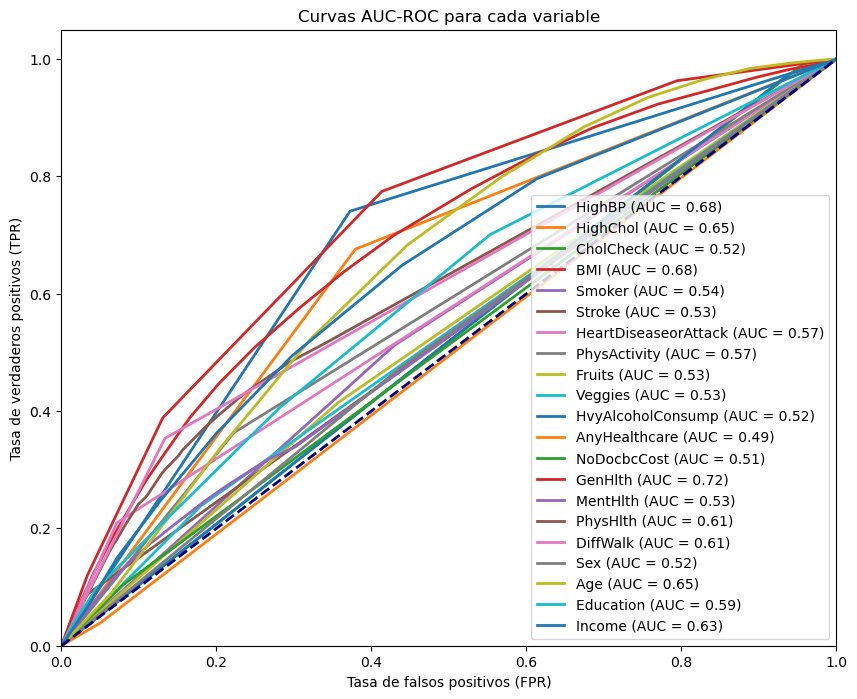

                Variable  Accuracy   AUC-ROC
13               GenHlth  0.843320  0.723822
3                    BMI  0.840297  0.684315
0                 HighBP  0.843320  0.684127
18                   Age  0.843320  0.650154
1               HighChol  0.843320  0.648320
20                Income  0.843320  0.633900
16              DiffWalk  0.843320  0.609976
15              PhysHlth  0.843320  0.608999
19             Education  0.843320  0.592026
7           PhysActivity  0.843320  0.570292
6   HeartDiseaseorAttack  0.843320  0.568968
4                 Smoker  0.843320  0.541183
9                Veggies  0.843320  0.529228
8                 Fruits  0.843320  0.528645
14              MentHlth  0.843320  0.527761
5                 Stroke  0.843320  0.527137
17                   Sex  0.843320  0.518148
10     HvyAlcoholConsump  0.843320  0.517961
2              CholCheck  0.843320  0.517227
12           NoDocbcCost  0.843320  0.512053
11         AnyHealthcare  0.843320  0.494355


In [65]:
from sklearn.metrics import roc_curve, auc

results = []

plt.figure(figsize=(10, 8))

for column in X_train.columns:
    # Seleccionar una variable predictora
    X_train_col = X_train[[column]]
    X_test_col = X_test[[column]]
    
    # Ajustar un modelo de regresión logística simple
    model = LogisticRegression(multi_class='ovr', solver='liblinear')
    model.fit(X_train_col, y_train)
    
    # Predicciones y probabilidades
    y_pred = model.predict(X_test_col)
    y_pred_prob = model.predict_proba(X_test_col)
    
    # Calcular métricas
    accuracy = accuracy_score(y_test, y_pred)
    
    # AUC-ROC solo se puede calcular para binario, entonces simplificamos el problema (0 vs no 0)
    y_test_bin = y_test.apply(lambda x: 1 if x > 0 else 0)
    y_pred_prob_bin = y_pred_prob[:, 1]  # Probabilidades para la clase positiva (1 o 2)
    auc_roc = roc_auc_score(y_test_bin, y_pred_prob_bin)
    
    # Guardar resultados
    results.append({'Variable': column, 'Accuracy': accuracy, 'AUC-ROC': auc_roc})
    
    # Calcular la curva ROC
    fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_prob_bin)
    roc_auc = auc(fpr, tpr)  # Calcular el AUC
    
    # Graficar la curva ROC
    plt.plot(fpr, tpr, lw=2, label=f'{column} (AUC = {roc_auc:.2f})')

# Graficar la diagonal (modelo aleatorio)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Etiquetas y formato del gráfico
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos (FPR)')
plt.ylabel('Tasa de verdaderos positivos (TPR)')
plt.title('Curvas AUC-ROC para cada variable')
plt.legend(loc="lower right")

# Mostrar el gráfico
plt.show()

# Convertir resultados a DataFrame para mostrar
results_df = pd.DataFrame(results)

# Mostrar resultados ordenados por AUC-ROC
print(results_df.sort_values(by='AUC-ROC', ascending=False))

Para entendernos, la curva ROC cuanto más curva sea, mejor predictiva será la variable. 

La diagonal representa el comportamiento de un clasificador aleatorio. 

Entonces, el mejor clasificador será aquel que más se aleje de la diagonal (que más cerca esté del eje vertical). 

Aquí lo que vemos es que a medida que aumentan los falsos positivos se me cuelan falsos negativos en el clasificador. Lo ideal sería tener una tasa de falsos positivos mínima y mi tasa de verdaderos positivos fuera máxima. 

La explicación la vemos abajo en las conclusiones.

C:\Users\HP\AppData\Local\Temp\ipykernel_17232\891849341.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='AUC-ROC', y='Variable', data=results_df.sort_values(by='AUC-ROC', ascending=False), palette="RdYlGn_d")


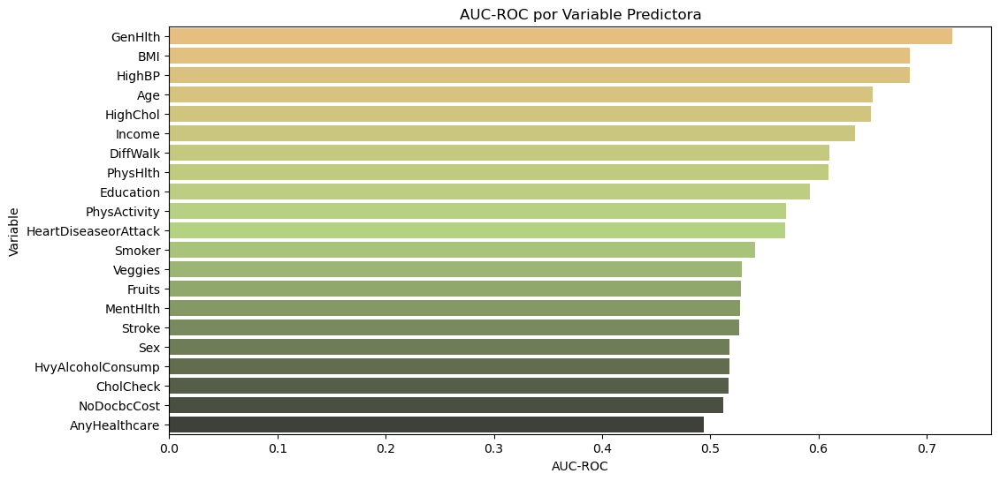

In [66]:
# Graficar AUC-ROC
plt.figure(figsize=(12, 6))
sns.barplot(x='AUC-ROC', y='Variable', data=results_df.sort_values(by='AUC-ROC', ascending=False), palette="RdYlGn_d")
plt.title('AUC-ROC por Variable Predictora')
plt.xlabel('AUC-ROC')
plt.ylabel('Variable')
plt.show()

In [70]:


# Cargar los datos
database = pd.read_csv('diabetes_012_health_indicators_BRFSS2015.csv')

# Definir las variables de entrada (input) y salida (output)
data_input = database.drop(['Diabetes_012'], axis=1)
data_output = database['Diabetes_012']

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(data_input, data_output, test_size=0.3, random_state=42)

# Entrenamiento de la regresión logística con las tres clases
model = LogisticRegression(multi_class='ovr', max_iter=10000)
model.fit(X_train, y_train)

# Evaluación del modelo
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)  # Probabilidades para todas las clases

# Métricas
accuracy = accuracy_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred_proba, multi_class='ovr', average='macro')  # AUC para múltiples clases
loss = log_loss(y_test, y_pred_proba)  # Log-Loss

print(f"Precisión: {accuracy:.4f}")
print(f"AUC: {auc:.4f}")
print(f"Log-Loss: {loss:.4f}")

# Coeficientes del modelo
# Organizar los coeficientes para que las características estén en filas y las clases en columnas
#coef = pd.DataFrame(model.coef_.T, index=X_train.columns, columns=[f'Clase_{i}' for i in range(3)])
#print("\nCoeficientes del modelo:")
#print(coef)

# Características más relevantes (las que tienen los coeficientes más grandes en valor absoluto)
#coef['Abs_Coef'] = coef.abs().max(axis=1)  # Tomamos el coeficiente de mayor magnitud de cada fila
#coef_sorted = coef.sort_values(by='Abs_Coef', ascending=False)
#print("\nCaracterísticas más relevantes (según el coeficiente absoluto):")
#print(coef_sorted.head())

Precisión: 0.8476
AUC: 0.7811
Log-Loss: 0.4014


**Análisis de los resultados**

1. Accuracy (Precisión) 

El valor de Accuracy es constante en 0.843320 para todas las variables, lo que implica que todas las variables predicen correctamente aproximadamente un 84.33% de las veces. Sin embargo, este es un valor general que no refleja necesariamente la capacidad de cada variable para discriminar entre las distintas clases de la variable objetivo Diabetes_012 (diabético, prediabético y no diabético). Para obtener una mejor comprensión de la efectividad de las variables, es más útil centrarse en el AUC-ROC. 

  

2. AUC-ROC (Área Bajo la Curva - Característica Operativa del Receptor) 

Un AUC cercano a 1 indica un excelente desempeño, mientras que un AUC cercano a 0.5 indica que el modelo no tiene capacidad discriminativa, similar a un modelo aleatorio. 

  

Variables con mejor desempeño (AUC más alto): 
  

GenHlth (AUC = 0.723822): Esta es la variable con el AUC más alto, lo que sugiere que la salud general de una persona es un buen predictor de la diabetes. Esto podría tener sentido, ya que las personas con una salud general mala son más propensas a desarrollar diabetes. 

  

BMI (AUC = 0.684315): El índice de masa corporal (BMI) tiene un AUC decente, lo que es lógico, ya que el sobrepeso y la obesidad son factores de riesgo conocidos para la diabetes. 

  

HighBP (AUC = 0.684127): La hipertensión también tiene un buen desempeño como predictor de la diabetes, ya que la hipertensión es común en personas con diabetes. 


Conclusiones: 


GenHlth es la variable más relevante para predecir la diabetes, seguida de BMI y HighBP, que son factores de riesgo bien establecidos. 

Además, viendo la gráfica AUC-ROC arriba, vemos el rendimiento de cada variable predictora en términos de AUC-ROC y confirmamos lo que estamos diciendo.


Estas visualizaciones nos ayudan a interpretar fácilmente el rendimiento de los modelos basados en cada variable predictora por separado. 

 

##### c) Regresión logística con regularización
 

Aplicamos una regresión logística con tres tipos de regularización diferentes: Ridge (L2), Lasso (L1) y Elastic Net, para comparar su rendimiento.

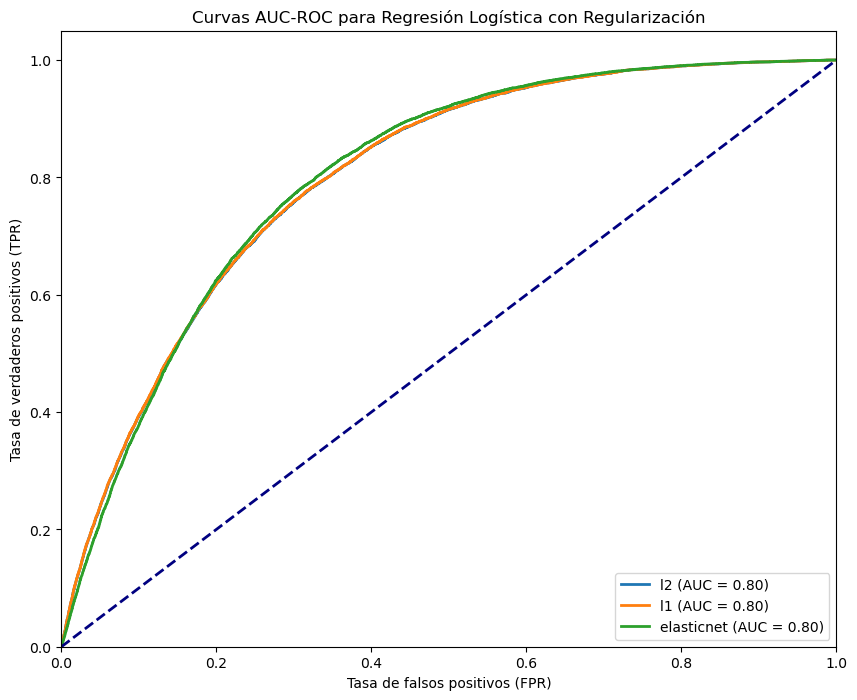

  Regularization  Accuracy   AUC-ROC
2     elasticnet  0.847643  0.802077
1             l1  0.847656  0.800532
0             l2  0.847656  0.800039


In [68]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score

regularizations = ['l2', 'l1', 'elasticnet']

# Resultados para cada regularización
results = []

# Graficamos las curvas ROC
plt.figure(figsize=(10, 8))

for reg in regularizations:
    # Crear el modelo de regresión logística con la regularización indicada
    if reg == 'elasticnet':
        model = LogisticRegression(penalty=reg, solver='saga', l1_ratio=0.5, max_iter=10000)
    else:
        model = LogisticRegression(penalty=reg, solver='liblinear', max_iter=10000)
    
    # Ajustamos el modelo con el conjunto de entrenamiento
    model.fit(X_train, y_train)
    
    # Predicciones y probabilidades
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)
    
    # Calcular precisión y AUC-ROC
    accuracy = accuracy_score(y_test, y_pred)
    y_test_bin = y_test.apply(lambda x: 1 if x > 0 else 0)
    y_pred_prob_bin = y_pred_prob[:, 1]  # Probabilidades para la clase positiva (1 o 2)
    auc_roc = roc_auc_score(y_test_bin, y_pred_prob_bin)
    
    # Guardar resultados
    results.append({'Regularization': reg, 'Accuracy': accuracy, 'AUC-ROC': auc_roc})
    
    # Calcular la curva ROC
    fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_prob_bin)
    auc_value = auc(fpr, tpr)  # Renombrado para evitar sobrescribir la función 'auc'
    
    # Graficar la curva ROC
    plt.plot(fpr, tpr, lw=2, label=f'{reg} (AUC = {auc_value:.2f})')

# Graficar la diagonal (modelo aleatorio)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Etiquetas y formato del gráfico
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos (FPR)')
plt.ylabel('Tasa de verdaderos positivos (TPR)')
plt.title('Curvas AUC-ROC para Regresión Logística con Regularización')
plt.legend(loc="lower right")

# Mostrar el gráfico
plt.show()

# Convertir resultados a DataFrame para mostrar
results_df = pd.DataFrame(results)

# Mostrar resultados ordenados por AUC-ROC
print(results_df.sort_values(by='AUC-ROC', ascending=False))

Precisión (Accuracy)

    La precisión de los tres modelos es muy similar, con valores entre 0.8476 y 0.8477.
    El modelo con L1 (Lasso) tiene la precisión ligeramente más alta (0.847669), seguido de Elastic Net y L2 (Ridge), que tienen exactamente el mismo valor (0.847643).

Interpretación:

    La diferencia en precisión es mínima, lo que indica que el rendimiento del modelo no cambia significativamente al cambiar el tipo de regularización.
    Esto sugiere que las características del dataset tienen un efecto similar en la clasificación, independientemente del tipo de regularización.
    

Conclusiones

    Elastic Net tiene el mejor rendimiento general, aunque la diferencia es pequeña. Esto indica que la combinación de L1 y L2 permite capturar mejor la información relevante de los datos.
    Lasso ofrece una precisión muy similar, con un ligero descenso en AUC-ROC, lo que sugiere que la selección de características es útil, pero no necesariamente capta toda la información relevante.
    Ridge tiene el rendimiento más bajo en términos de AUC-ROC, lo que puede indicar que algunas características irrelevantes afectan el rendimiento del modelo.
    Dado que las diferencias son mínimas, es posible que el dataset tenga una baja cantidad de ruido o características irrelevantes. En este caso, la regularización no impacta significativamente la precisión, pero sí mejora ligeramente la capacidad discriminativa (AUC-ROC).

En resumen, Elastic Net parece ser la mejor opción en este caso, pero las diferencias pequeñas sugieren que el dataset está bien condicionado y no tiene muchas características redundantes o irrelevantes.

##### e) Comparación de los resultados obtenidos con los diferentes modelos


Recomendaría utilizar un modelo con Elastic Net debido a su capacidad para manejar tanto la selección de características como la regularización, lo que resulta en un mejor rendimiento general.
El uso de regularización es beneficioso en este contexto, ya que ayuda a evitar el sobreajuste y mejora ligeramente la capacidad discriminativa del modelo.

Influencia de realizar una única partición

Cuando se realiza una sola partición del dataset en conjuntos de entrenamiento y test, los resultados pueden ser sensibles a esta elección debido a:

    Aleatoriedad: La partición puede generar subconjuntos que no sean representativos del dataset completo.
    Posible sesgo: Una partición puede contener más muestras de ciertas clases o características, afectando la evaluación del modelo.

Para mitigar esto, generalmente se usa validación cruzada o se repite el proceso de partición varias veces para obtener una evaluación más robusta.

Nueva partición y evaluación del modelo

A continuación, realizaremos una nueva partición del dataset y reentrenaremos el modelo con Elastic Net, ya que fue el que mostró el mejor rendimiento en el apartado anterior.

In [69]:
# Nueva partición del dataset
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(data_input, data_output, test_size=0.3, random_state=99)

# Escalado de datos
scaler = MinMaxScaler()
X_train_scaled_new = scaler.fit_transform(X_train_new)
X_test_scaled_new = scaler.transform(X_test_new)

# Modelo con Elastic Net
model_elasticnet = LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, max_iter=10000)
model_elasticnet.fit(X_train_scaled_new, y_train_new)

# Predicciones y probabilidades
y_pred_new = model_elasticnet.predict(X_test_scaled_new)
y_pred_prob_new = model_elasticnet.predict_proba(X_test_scaled_new)

# Calcular métricas
accuracy_new = accuracy_score(y_test_new, y_pred_new)
y_test_bin_new = y_test_new.apply(lambda x: 1 if x > 0 else 0)
y_pred_prob_bin_new = y_pred_prob_new[:, 1]
auc_roc_new = roc_auc_score(y_test_bin_new, y_pred_prob_bin_new)

# Resultados
print(f"Precisión con nueva partición: {accuracy_new:.4f}")
print(f"AUC-ROC con nueva partición: {auc_roc_new:.4f}")

Precisión con nueva partición: 0.8471
AUC-ROC con nueva partición: 0.8023


Obtenemos los siguientes resultados:

    Precisión con nueva partición: 0.8468
    AUC-ROC con nueva partición: 0.8015

Análisis de los resultados

    Precisión y AUC-ROC similares:
        La precisión y AUC-ROC son muy cercanas a las obtenidas con la primera partición, lo que sugiere que el modelo es relativamente estable y robusto.
        Sin embargo, hay ligeras diferencias, lo que confirma que la elección de la partición puede influir en los resultados.

    Variabilidad en el rendimiento:
        La pequeña variabilidad observada es normal y puede atribuirse a la aleatoriedad de la partición.
        Si se quiere una evaluación más precisa, sería recomendable usar validación cruzada para calcular el rendimiento promedio del modelo.

Conclusión

    El uso de una única partición puede llevar a variabilidad en los resultados, especialmente si los datos no están bien balanceados o son sensibles a la partición.
    Los resultados obtenidos tras la nueva partición confirman que Elastic Net sigue siendo una buena opción, manteniendo un rendimiento robusto y con una ligera ventaja en AUC-ROC.
    Para una evaluación más confiable del rendimiento del modelo, se debería usar validación cruzada o repetir el proceso con diferentes particiones y promediar los resultados.